# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [6, 48]
dtc_w1 = 25
dtc_w2 = 2.5

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            )
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=0.5, 
    limit_val_batches=0.5,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=None,
    model_level_metrics_helper_covariates=None
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: upyhyj71
Name: royal-snow-604
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/upyhyj71
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_004258-upyhyj71/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 219,375,458,189,385,303,548,141,455,372,427,395,235,277,47,217,462,300,292,543,240,283,152,46,336,140,109,302,103,82,188,188,51,328,224,168,264,143,85,190,377,434,319,999,142,364,177,181,274,317,217,139,386,267,258,399,310,622,296,284,232,583,236,145,264,335,294,733,355,356,265,368,352,353,131,220,211,158,56,121,205,509,289,283,347,228,145,233,384,177,144,114,261,383,160,154,453,77,149,299,163,357,96,258,187,221,345,136,148,313,277,105,112,347,336,352,264,45,51,218,221,263,84,209,317,244,203,227,294,203,951,269,194,510,294,160,486,347,520,454,212,473,463,277,344,235,348,235,295,293,279,241,251,394,402,250,235,190,152,635,251,223,139,149,174,161,542,249,383,216,271,410,602,411,309,267,229,229,183,173,207,192,206,237,608,341,320,365,371,7089,421,280,201,178,364,171,269,268,160,31

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 57,106,100,43,110,76,139,34,127,91,106,69,66,81,12,47,100,65,56,120,66,52,36,18,74,44,25,62,23,25,42,57,13,84,62,43,67,37,29,47,91,132,96,220,37,111,38,60,81,81,68,39,84,61,71,79,77,165,86,82,58,148,61,38,58,90,60,172,86,89,59,91,99,92,28,64,66,33,15,30,42,121,93,62,79,44,47,62,95,39,31,16,68,111,32,46,99,19,44,69,52,106,30,45,50,53,65,31,35,55,72,35,29,98,91,92,63,9,8,48,57,66,12,45,78,67,34,71,67,60,246,68,47,137,81,32,137,85,106,127,49,98,116,61,107,65,96,67,68,73,60,61,68,106,95,63,63,47,40,135,59,70,37,37,41,41,125,66,97,53,74,102,148,102,63,55,55,62,35,49,57,44,49,68,155,93,92,81,92,1818,109,69,44,33,82,46,62,64,40,86,29,73,66,77,92,129,77,55,101,20,19,43,58,78,19,53,60,88,29,46,65,69,55,51,69,56,62,62,56,69,75,109,72,80,10,48,41,121,146,134,91,59,76,58,193,88,27,54,51,

Epoch 1/600:   0%|          | 1/600 [00:15<2:36:51, 15.71s/it]

Epoch 1/600:   0%|          | 1/600 [00:15<2:36:51, 15.71s/it, v_num=71_1, total_loss_train=1.89e+3, kl_local_train=63.7]

Epoch 2/600:   0%|          | 1/600 [00:15<2:36:51, 15.71s/it, v_num=71_1, total_loss_train=1.89e+3, kl_local_train=63.7]

Epoch 2/600:   0%|          | 2/600 [00:21<1:38:29,  9.88s/it, v_num=71_1, total_loss_train=1.89e+3, kl_local_train=63.7]

Epoch 2/600:   0%|          | 2/600 [00:21<1:38:29,  9.88s/it, v_num=71_1, total_loss_train=1.35e+3, kl_local_train=78.8]

Epoch 3/600:   0%|          | 2/600 [00:21<1:38:29,  9.88s/it, v_num=71_1, total_loss_train=1.35e+3, kl_local_train=78.8]

Epoch 3/600:   0%|          | 3/600 [00:27<1:20:01,  8.04s/it, v_num=71_1, total_loss_train=1.35e+3, kl_local_train=78.8]

Epoch 3/600:   0%|          | 3/600 [00:27<1:20:01,  8.04s/it, v_num=71_1, total_loss_train=1.33e+3, kl_local_train=73.3]

Epoch 4/600:   0%|          | 3/600 [00:27<1:20:01,  8.04s/it, v_num=71_1, total_loss_train=1.33e+3, kl_local_train=73.3]

Epoch 4/600:   1%|          | 4/600 [00:33<1:11:14,  7.17s/it, v_num=71_1, total_loss_train=1.33e+3, kl_local_train=73.3]

Epoch 4/600:   1%|          | 4/600 [00:33<1:11:14,  7.17s/it, v_num=71_1, total_loss_train=1.33e+3, kl_local_train=59.2]

Epoch 5/600:   1%|          | 4/600 [00:33<1:11:14,  7.17s/it, v_num=71_1, total_loss_train=1.33e+3, kl_local_train=59.2]

Epoch 5/600:   1%|          | 5/600 [00:39<1:06:17,  6.69s/it, v_num=71_1, total_loss_train=1.33e+3, kl_local_train=59.2]

Epoch 5/600:   1%|          | 5/600 [00:39<1:06:17,  6.69s/it, v_num=71_1, total_loss_train=1.32e+3, kl_local_train=37]  

Epoch 6/600:   1%|          | 5/600 [00:39<1:06:17,  6.69s/it, v_num=71_1, total_loss_train=1.32e+3, kl_local_train=37]

Epoch 6/600:   1%|          | 6/600 [00:44<1:03:22,  6.40s/it, v_num=71_1, total_loss_train=1.32e+3, kl_local_train=37]

Epoch 6/600:   1%|          | 6/600 [00:44<1:03:22,  6.40s/it, v_num=71_1, total_loss_train=1.3e+3, kl_local_train=35.4]

Epoch 7/600:   1%|          | 6/600 [00:44<1:03:22,  6.40s/it, v_num=71_1, total_loss_train=1.3e+3, kl_local_train=35.4]

Epoch 7/600:   1%|          | 7/600 [00:50<1:01:26,  6.22s/it, v_num=71_1, total_loss_train=1.3e+3, kl_local_train=35.4]

Epoch 7/600:   1%|          | 7/600 [00:50<1:01:26,  6.22s/it, v_num=71_1, total_loss_train=1.29e+3, kl_local_train=44.8]

Epoch 8/600:   1%|          | 7/600 [00:50<1:01:26,  6.22s/it, v_num=71_1, total_loss_train=1.29e+3, kl_local_train=44.8]

Epoch 8/600:   1%|▏         | 8/600 [00:56<1:00:11,  6.10s/it, v_num=71_1, total_loss_train=1.29e+3, kl_local_train=44.8]

Epoch 8/600:   1%|▏         | 8/600 [00:56<1:00:11,  6.10s/it, v_num=71_1, total_loss_train=1.28e+3, kl_local_train=49.9]

Epoch 9/600:   1%|▏         | 8/600 [00:56<1:00:11,  6.10s/it, v_num=71_1, total_loss_train=1.28e+3, kl_local_train=49.9]

Epoch 9/600:   2%|▏         | 9/600 [01:02<59:18,  6.02s/it, v_num=71_1, total_loss_train=1.28e+3, kl_local_train=49.9]  

Epoch 9/600:   2%|▏         | 9/600 [01:02<59:18,  6.02s/it, v_num=71_1, total_loss_train=1.27e+3, kl_local_train=51.8]

Epoch 10/600:   2%|▏         | 9/600 [01:02<59:18,  6.02s/it, v_num=71_1, total_loss_train=1.27e+3, kl_local_train=51.8]

Epoch 10/600:   2%|▏         | 10/600 [01:08<58:44,  5.97s/it, v_num=71_1, total_loss_train=1.27e+3, kl_local_train=51.8]

Epoch 10/600:   2%|▏         | 10/600 [01:08<58:44,  5.97s/it, v_num=71_1, total_loss_train=1.27e+3, kl_local_train=53.5]

Epoch 11/600:   2%|▏         | 10/600 [01:08<58:44,  5.97s/it, v_num=71_1, total_loss_train=1.27e+3, kl_local_train=53.5]

Epoch 11/600:   2%|▏         | 11/600 [01:14<58:23,  5.95s/it, v_num=71_1, total_loss_train=1.27e+3, kl_local_train=53.5]

Epoch 11/600:   2%|▏         | 11/600 [01:14<58:23,  5.95s/it, v_num=71_1, total_loss_train=1.26e+3, kl_local_train=53.4]

Epoch 12/600:   2%|▏         | 11/600 [01:14<58:23,  5.95s/it, v_num=71_1, total_loss_train=1.26e+3, kl_local_train=53.4]

Epoch 12/600:   2%|▏         | 12/600 [01:20<57:56,  5.91s/it, v_num=71_1, total_loss_train=1.26e+3, kl_local_train=53.4]

Epoch 12/600:   2%|▏         | 12/600 [01:20<57:56,  5.91s/it, v_num=71_1, total_loss_train=1.26e+3, kl_local_train=52.7]

Epoch 13/600:   2%|▏         | 12/600 [01:20<57:56,  5.91s/it, v_num=71_1, total_loss_train=1.26e+3, kl_local_train=52.7]

Epoch 13/600:   2%|▏         | 13/600 [01:25<57:42,  5.90s/it, v_num=71_1, total_loss_train=1.26e+3, kl_local_train=52.7]

Epoch 13/600:   2%|▏         | 13/600 [01:25<57:42,  5.90s/it, v_num=71_1, total_loss_train=1.26e+3, kl_local_train=52.3]

Epoch 14/600:   2%|▏         | 13/600 [01:25<57:42,  5.90s/it, v_num=71_1, total_loss_train=1.26e+3, kl_local_train=52.3]

Epoch 14/600:   2%|▏         | 14/600 [01:31<57:27,  5.88s/it, v_num=71_1, total_loss_train=1.26e+3, kl_local_train=52.3]

Epoch 14/600:   2%|▏         | 14/600 [01:31<57:27,  5.88s/it, v_num=71_1, total_loss_train=1.25e+3, kl_local_train=52.5]

Epoch 15/600:   2%|▏         | 14/600 [01:31<57:27,  5.88s/it, v_num=71_1, total_loss_train=1.25e+3, kl_local_train=52.5]

Epoch 15/600:   2%|▎         | 15/600 [01:37<57:17,  5.88s/it, v_num=71_1, total_loss_train=1.25e+3, kl_local_train=52.5]

Epoch 15/600:   2%|▎         | 15/600 [01:37<57:17,  5.88s/it, v_num=71_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 16/600:   2%|▎         | 15/600 [01:37<57:17,  5.88s/it, v_num=71_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 16/600:   3%|▎         | 16/600 [01:43<57:07,  5.87s/it, v_num=71_1, total_loss_train=1.25e+3, kl_local_train=52.3]

Epoch 16/600:   3%|▎         | 16/600 [01:43<57:07,  5.87s/it, v_num=71_1, total_loss_train=1.25e+3, kl_local_train=53.2]

Epoch 17/600:   3%|▎         | 16/600 [01:43<57:07,  5.87s/it, v_num=71_1, total_loss_train=1.25e+3, kl_local_train=53.2]

Epoch 17/600:   3%|▎         | 17/600 [01:49<56:57,  5.86s/it, v_num=71_1, total_loss_train=1.25e+3, kl_local_train=53.2]

Epoch 17/600:   3%|▎         | 17/600 [01:49<56:57,  5.86s/it, v_num=71_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 18/600:   3%|▎         | 17/600 [01:49<56:57,  5.86s/it, v_num=71_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 18/600:   3%|▎         | 18/600 [01:55<56:52,  5.86s/it, v_num=71_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 18/600:   3%|▎         | 18/600 [01:55<56:52,  5.86s/it, v_num=71_1, total_loss_train=1.24e+3, kl_local_train=53.3]

Epoch 19/600:   3%|▎         | 18/600 [01:55<56:52,  5.86s/it, v_num=71_1, total_loss_train=1.24e+3, kl_local_train=53.3]

Epoch 19/600:   3%|▎         | 19/600 [02:00<56:44,  5.86s/it, v_num=71_1, total_loss_train=1.24e+3, kl_local_train=53.3]

Epoch 19/600:   3%|▎         | 19/600 [02:00<56:44,  5.86s/it, v_num=71_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 20/600:   3%|▎         | 19/600 [02:00<56:44,  5.86s/it, v_num=71_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 20/600:   3%|▎         | 20/600 [02:06<56:34,  5.85s/it, v_num=71_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 20/600:   3%|▎         | 20/600 [02:06<56:34,  5.85s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 21/600:   3%|▎         | 20/600 [02:06<56:34,  5.85s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 21/600:   4%|▎         | 21/600 [02:12<56:28,  5.85s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 21/600:   4%|▎         | 21/600 [02:12<56:28,  5.85s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 22/600:   4%|▎         | 21/600 [02:12<56:28,  5.85s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 22/600:   4%|▎         | 22/600 [02:18<56:07,  5.83s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 22/600:   4%|▎         | 22/600 [02:18<56:07,  5.83s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.5]

Epoch 23/600:   4%|▎         | 22/600 [02:18<56:07,  5.83s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.5]

Epoch 23/600:   4%|▍         | 23/600 [02:24<56:02,  5.83s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.5]

Epoch 23/600:   4%|▍         | 23/600 [02:24<56:02,  5.83s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.7]

Epoch 24/600:   4%|▍         | 23/600 [02:24<56:02,  5.83s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.7]

Epoch 24/600:   4%|▍         | 24/600 [02:30<55:57,  5.83s/it, v_num=71_1, total_loss_train=1.23e+3, kl_local_train=53.7]

Epoch 24/600:   4%|▍         | 24/600 [02:30<55:57,  5.83s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=53.8]

Epoch 25/600:   4%|▍         | 24/600 [02:30<55:57,  5.83s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=53.8]

Epoch 25/600:   4%|▍         | 25/600 [02:35<55:56,  5.84s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=53.8]

Epoch 25/600:   4%|▍         | 25/600 [02:35<55:56,  5.84s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=54]  

Epoch 26/600:   4%|▍         | 25/600 [02:35<55:56,  5.84s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=54]

Epoch 26/600:   4%|▍         | 26/600 [02:41<55:55,  5.85s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=54]

Epoch 26/600:   4%|▍         | 26/600 [02:41<55:55,  5.85s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=54.3]

Epoch 27/600:   4%|▍         | 26/600 [02:41<55:55,  5.85s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=54.3]

Epoch 27/600:   4%|▍         | 27/600 [02:47<55:50,  5.85s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=54.3]

Epoch 27/600:   4%|▍         | 27/600 [02:47<55:50,  5.85s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=53.9]

Epoch 28/600:   4%|▍         | 27/600 [02:47<55:50,  5.85s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=53.9]

Epoch 28/600:   5%|▍         | 28/600 [02:53<55:42,  5.84s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=53.9]

Epoch 28/600:   5%|▍         | 28/600 [02:53<55:42,  5.84s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=54]  

Epoch 29/600:   5%|▍         | 28/600 [02:53<55:42,  5.84s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=54]

Epoch 29/600:   5%|▍         | 29/600 [02:59<55:35,  5.84s/it, v_num=71_1, total_loss_train=1.22e+3, kl_local_train=54]

Epoch 29/600:   5%|▍         | 29/600 [02:59<55:35,  5.84s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.6]

Epoch 30/600:   5%|▍         | 29/600 [02:59<55:35,  5.84s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.6]

Epoch 30/600:   5%|▌         | 30/600 [03:05<55:29,  5.84s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.6]

Epoch 30/600:   5%|▌         | 30/600 [03:05<55:29,  5.84s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.4]

Epoch 31/600:   5%|▌         | 30/600 [03:05<55:29,  5.84s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.4]

Epoch 31/600:   5%|▌         | 31/600 [03:11<55:28,  5.85s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.4]

Epoch 31/600:   5%|▌         | 31/600 [03:11<55:28,  5.85s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.5]

Epoch 32/600:   5%|▌         | 31/600 [03:11<55:28,  5.85s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.5]

Epoch 32/600:   5%|▌         | 32/600 [03:16<55:24,  5.85s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.5]

Epoch 32/600:   5%|▌         | 32/600 [03:16<55:24,  5.85s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.3]

Epoch 33/600:   5%|▌         | 32/600 [03:16<55:24,  5.85s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.3]

Epoch 33/600:   6%|▌         | 33/600 [03:22<55:14,  5.85s/it, v_num=71_1, total_loss_train=1.21e+3, kl_local_train=53.3]

Epoch 33/600:   6%|▌         | 33/600 [03:22<55:14,  5.85s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.3] 

Epoch 34/600:   6%|▌         | 33/600 [03:22<55:14,  5.85s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 34/600:   6%|▌         | 34/600 [03:28<55:11,  5.85s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 34/600:   6%|▌         | 34/600 [03:28<55:11,  5.85s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.1]

Epoch 35/600:   6%|▌         | 34/600 [03:28<55:11,  5.85s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.1]

Epoch 35/600:   6%|▌         | 35/600 [03:34<55:13,  5.87s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.1]

Epoch 35/600:   6%|▌         | 35/600 [03:34<55:13,  5.87s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 36/600:   6%|▌         | 35/600 [03:34<55:13,  5.87s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 36/600:   6%|▌         | 36/600 [03:40<55:03,  5.86s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 36/600:   6%|▌         | 36/600 [03:40<55:03,  5.86s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.1]

Epoch 37/600:   6%|▌         | 36/600 [03:40<55:03,  5.86s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.1]

Epoch 37/600:   6%|▌         | 37/600 [03:46<54:56,  5.85s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.1]

Epoch 37/600:   6%|▌         | 37/600 [03:46<54:56,  5.85s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.4]

Epoch 38/600:   6%|▌         | 37/600 [03:46<54:56,  5.85s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.4]

Epoch 38/600:   6%|▋         | 38/600 [03:52<54:54,  5.86s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.4]

Epoch 38/600:   6%|▋         | 38/600 [03:52<54:54,  5.86s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.7]

Epoch 39/600:   6%|▋         | 38/600 [03:52<54:54,  5.86s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.7]

Epoch 39/600:   6%|▋         | 39/600 [03:57<54:48,  5.86s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.7]

Epoch 39/600:   6%|▋         | 39/600 [03:57<54:48,  5.86s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 40/600:   6%|▋         | 39/600 [03:57<54:48,  5.86s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 40/600:   7%|▋         | 40/600 [04:03<54:40,  5.86s/it, v_num=71_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 40/600:   7%|▋         | 40/600 [04:03<54:40,  5.86s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.6]

Epoch 41/600:   7%|▋         | 40/600 [04:03<54:40,  5.86s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.6]

Epoch 41/600:   7%|▋         | 41/600 [04:09<54:32,  5.85s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.6]

Epoch 41/600:   7%|▋         | 41/600 [04:09<54:32,  5.85s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.4]

Epoch 42/600:   7%|▋         | 41/600 [04:09<54:32,  5.85s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.4]

Epoch 42/600:   7%|▋         | 42/600 [04:15<54:23,  5.85s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.4]

Epoch 42/600:   7%|▋         | 42/600 [04:15<54:23,  5.85s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.1]

Epoch 43/600:   7%|▋         | 42/600 [04:15<54:23,  5.85s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.1]

Epoch 43/600:   7%|▋         | 43/600 [04:21<54:13,  5.84s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.1]

Epoch 43/600:   7%|▋         | 43/600 [04:21<54:13,  5.84s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.2]

Epoch 44/600:   7%|▋         | 43/600 [04:21<54:13,  5.84s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.2]

Epoch 44/600:   7%|▋         | 44/600 [04:27<54:07,  5.84s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.2]

Epoch 44/600:   7%|▋         | 44/600 [04:27<54:07,  5.84s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53]  

Epoch 45/600:   7%|▋         | 44/600 [04:27<54:07,  5.84s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53]

Epoch 45/600:   8%|▊         | 45/600 [04:32<53:58,  5.84s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53]

Epoch 45/600:   8%|▊         | 45/600 [04:32<53:58,  5.84s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.6]

Epoch 46/600:   8%|▊         | 45/600 [04:32<53:58,  5.84s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.6]

Epoch 46/600:   8%|▊         | 46/600 [04:38<54:20,  5.89s/it, v_num=71_1, total_loss_train=1.19e+3, kl_local_train=53.6]

Epoch 46/600:   8%|▊         | 46/600 [04:38<54:20,  5.89s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 47/600:   8%|▊         | 46/600 [04:38<54:20,  5.89s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 47/600:   8%|▊         | 47/600 [04:44<54:17,  5.89s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 47/600:   8%|▊         | 47/600 [04:44<54:17,  5.89s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 48/600:   8%|▊         | 47/600 [04:44<54:17,  5.89s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 48/600:   8%|▊         | 48/600 [04:50<54:05,  5.88s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 48/600:   8%|▊         | 48/600 [04:50<54:05,  5.88s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=54.1]

Epoch 49/600:   8%|▊         | 48/600 [04:50<54:05,  5.88s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=54.1]

Epoch 49/600:   8%|▊         | 49/600 [04:56<53:58,  5.88s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=54.1]

Epoch 49/600:   8%|▊         | 49/600 [04:56<53:58,  5.88s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.7]

Epoch 50/600:   8%|▊         | 49/600 [04:56<53:58,  5.88s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.7]

Epoch 50/600:   8%|▊         | 50/600 [05:02<53:54,  5.88s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.7]

Epoch 50/600:   8%|▊         | 50/600 [05:02<53:54,  5.88s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 51/600:   8%|▊         | 50/600 [05:02<53:54,  5.88s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 51/600:   8%|▊         | 51/600 [05:08<53:58,  5.90s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 51/600:   8%|▊         | 51/600 [05:08<53:58,  5.90s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.1]

Epoch 52/600:   8%|▊         | 51/600 [05:08<53:58,  5.90s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.1]

Epoch 52/600:   9%|▊         | 52/600 [05:14<54:12,  5.94s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.1]

Epoch 52/600:   9%|▊         | 52/600 [05:14<54:12,  5.94s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.2]

Epoch 53/600:   9%|▊         | 52/600 [05:14<54:12,  5.94s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.2]

Epoch 53/600:   9%|▉         | 53/600 [05:20<54:05,  5.93s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.2]

Epoch 53/600:   9%|▉         | 53/600 [05:20<54:05,  5.93s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 54/600:   9%|▉         | 53/600 [05:20<54:05,  5.93s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 54/600:   9%|▉         | 54/600 [05:26<53:46,  5.91s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53.4]

Epoch 54/600:   9%|▉         | 54/600 [05:26<53:46,  5.91s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53]  

Epoch 55/600:   9%|▉         | 54/600 [05:26<53:46,  5.91s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53]

Epoch 55/600:   9%|▉         | 55/600 [05:32<53:27,  5.88s/it, v_num=71_1, total_loss_train=1.18e+3, kl_local_train=53]

Epoch 55/600:   9%|▉         | 55/600 [05:32<53:27,  5.88s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=53.2]

Epoch 56/600:   9%|▉         | 55/600 [05:32<53:27,  5.88s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=53.2]

Epoch 56/600:   9%|▉         | 56/600 [05:37<53:16,  5.88s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=53.2]

Epoch 56/600:   9%|▉         | 56/600 [05:37<53:16,  5.88s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.8]

Epoch 57/600:   9%|▉         | 56/600 [05:37<53:16,  5.88s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.8]

Epoch 57/600:  10%|▉         | 57/600 [05:43<53:10,  5.88s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.8]

Epoch 57/600:  10%|▉         | 57/600 [05:43<53:10,  5.88s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.6]

Epoch 58/600:  10%|▉         | 57/600 [05:43<53:10,  5.88s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.6]

Epoch 58/600:  10%|▉         | 58/600 [05:49<53:00,  5.87s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.6]

Epoch 58/600:  10%|▉         | 58/600 [05:49<53:00,  5.87s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.8]

Epoch 59/600:  10%|▉         | 58/600 [05:49<53:00,  5.87s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.8]

Epoch 59/600:  10%|▉         | 59/600 [05:55<52:54,  5.87s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.8]

Epoch 59/600:  10%|▉         | 59/600 [05:55<52:54,  5.87s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.7]

Epoch 60/600:  10%|▉         | 59/600 [05:55<52:54,  5.87s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.7]

Epoch 60/600:  10%|█         | 60/600 [06:01<52:41,  5.85s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.7]

Epoch 60/600:  10%|█         | 60/600 [06:01<52:41,  5.85s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 61/600:  10%|█         | 60/600 [06:01<52:41,  5.85s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 61/600:  10%|█         | 61/600 [06:07<52:32,  5.85s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 61/600:  10%|█         | 61/600 [06:07<52:32,  5.85s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 62/600:  10%|█         | 61/600 [06:07<52:32,  5.85s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 62/600:  10%|█         | 62/600 [06:12<52:25,  5.85s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 62/600:  10%|█         | 62/600 [06:13<52:25,  5.85s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.2]

Epoch 63/600:  10%|█         | 62/600 [06:13<52:25,  5.85s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.2]

Epoch 63/600:  10%|█         | 63/600 [06:18<52:15,  5.84s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52.2]

Epoch 63/600:  10%|█         | 63/600 [06:18<52:15,  5.84s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52]  

Epoch 64/600:  10%|█         | 63/600 [06:18<52:15,  5.84s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52]

Epoch 64/600:  11%|█         | 64/600 [06:24<52:09,  5.84s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=52]

Epoch 64/600:  11%|█         | 64/600 [06:24<52:09,  5.84s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=51.9]

Epoch 65/600:  11%|█         | 64/600 [06:24<52:09,  5.84s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=51.9]

Epoch 65/600:  11%|█         | 65/600 [06:30<52:05,  5.84s/it, v_num=71_1, total_loss_train=1.17e+3, kl_local_train=51.9]

Epoch 65/600:  11%|█         | 65/600 [06:30<52:05,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.6]

Epoch 66/600:  11%|█         | 65/600 [06:30<52:05,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.6]

Epoch 66/600:  11%|█         | 66/600 [06:36<52:00,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.6]

Epoch 66/600:  11%|█         | 66/600 [06:36<52:00,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.8]

Epoch 67/600:  11%|█         | 66/600 [06:36<52:00,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.8]

Epoch 67/600:  11%|█         | 67/600 [06:42<51:55,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.8]

Epoch 67/600:  11%|█         | 67/600 [06:42<51:55,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.4]

Epoch 68/600:  11%|█         | 67/600 [06:42<51:55,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.4]

Epoch 68/600:  11%|█▏        | 68/600 [06:48<51:50,  5.85s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.4]

Epoch 68/600:  11%|█▏        | 68/600 [06:48<51:50,  5.85s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.3]

Epoch 69/600:  11%|█▏        | 68/600 [06:48<51:50,  5.85s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.3]

Epoch 69/600:  12%|█▏        | 69/600 [06:53<51:44,  5.85s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.3]

Epoch 69/600:  12%|█▏        | 69/600 [06:53<51:44,  5.85s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.1]

Epoch 70/600:  12%|█▏        | 69/600 [06:53<51:44,  5.85s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.1]

Epoch 70/600:  12%|█▏        | 70/600 [06:59<51:39,  5.85s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51.1]

Epoch 70/600:  12%|█▏        | 70/600 [06:59<51:39,  5.85s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51]  

Epoch 71/600:  12%|█▏        | 70/600 [06:59<51:39,  5.85s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51]

Epoch 71/600:  12%|█▏        | 71/600 [07:05<51:31,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51]

Epoch 71/600:  12%|█▏        | 71/600 [07:05<51:31,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51]

Epoch 72/600:  12%|█▏        | 71/600 [07:05<51:31,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51]

Epoch 72/600:  12%|█▏        | 72/600 [07:11<51:25,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51]

Epoch 72/600:  12%|█▏        | 72/600 [07:11<51:25,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51]

Epoch 73/600:  12%|█▏        | 72/600 [07:11<51:25,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51]

Epoch 73/600:  12%|█▏        | 73/600 [07:17<51:16,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=51]

Epoch 73/600:  12%|█▏        | 73/600 [07:17<51:16,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.9]

Epoch 74/600:  12%|█▏        | 73/600 [07:17<51:16,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.9]

Epoch 74/600:  12%|█▏        | 74/600 [07:23<51:11,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.9]

Epoch 74/600:  12%|█▏        | 74/600 [07:23<51:11,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.8]

Epoch 75/600:  12%|█▏        | 74/600 [07:23<51:11,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.8]

Epoch 75/600:  12%|█▎        | 75/600 [07:28<51:07,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.8]

Epoch 75/600:  12%|█▎        | 75/600 [07:28<51:07,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.7]

Epoch 76/600:  12%|█▎        | 75/600 [07:28<51:07,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.7]

Epoch 76/600:  13%|█▎        | 76/600 [07:34<51:02,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.7]

Epoch 76/600:  13%|█▎        | 76/600 [07:34<51:02,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.7]

Epoch 77/600:  13%|█▎        | 76/600 [07:34<51:02,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.7]

Epoch 77/600:  13%|█▎        | 77/600 [07:40<50:56,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.7]

Epoch 77/600:  13%|█▎        | 77/600 [07:40<50:56,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.4]

Epoch 78/600:  13%|█▎        | 77/600 [07:40<50:56,  5.84s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.4]

Epoch 78/600:  13%|█▎        | 78/600 [07:46<50:52,  5.85s/it, v_num=71_1, total_loss_train=1.16e+3, kl_local_train=50.4]

Epoch 78/600:  13%|█▎        | 78/600 [07:46<50:52,  5.85s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 79/600:  13%|█▎        | 78/600 [07:46<50:52,  5.85s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 79/600:  13%|█▎        | 79/600 [07:52<50:47,  5.85s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 79/600:  13%|█▎        | 79/600 [07:52<50:47,  5.85s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 80/600:  13%|█▎        | 79/600 [07:52<50:47,  5.85s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 80/600:  13%|█▎        | 80/600 [07:58<50:39,  5.85s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 80/600:  13%|█▎        | 80/600 [07:58<50:39,  5.85s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.6]

Epoch 81/600:  13%|█▎        | 80/600 [07:58<50:39,  5.85s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.6]

Epoch 81/600:  14%|█▎        | 81/600 [08:04<50:34,  5.85s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.6]

Epoch 81/600:  14%|█▎        | 81/600 [08:04<50:34,  5.85s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 82/600:  14%|█▎        | 81/600 [08:04<50:34,  5.85s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 82/600:  14%|█▎        | 82/600 [08:09<50:24,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 82/600:  14%|█▎        | 82/600 [08:09<50:24,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 83/600:  14%|█▎        | 82/600 [08:09<50:24,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 83/600:  14%|█▍        | 83/600 [08:15<50:19,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 83/600:  14%|█▍        | 83/600 [08:15<50:19,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 84/600:  14%|█▍        | 83/600 [08:15<50:19,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 84/600:  14%|█▍        | 84/600 [08:21<50:12,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 84/600:  14%|█▍        | 84/600 [08:21<50:12,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 85/600:  14%|█▍        | 84/600 [08:21<50:12,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 85/600:  14%|█▍        | 85/600 [08:27<50:06,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 85/600:  14%|█▍        | 85/600 [08:27<50:06,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 86/600:  14%|█▍        | 85/600 [08:27<50:06,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 86/600:  14%|█▍        | 86/600 [08:33<50:00,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 86/600:  14%|█▍        | 86/600 [08:33<50:00,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 87/600:  14%|█▍        | 86/600 [08:33<50:00,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 87/600:  14%|█▍        | 87/600 [08:39<49:53,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 87/600:  14%|█▍        | 87/600 [08:39<49:53,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 88/600:  14%|█▍        | 87/600 [08:39<49:53,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 88/600:  15%|█▍        | 88/600 [08:44<49:49,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 88/600:  15%|█▍        | 88/600 [08:44<49:49,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.4]

Epoch 89/600:  15%|█▍        | 88/600 [08:44<49:49,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.4]

Epoch 89/600:  15%|█▍        | 89/600 [08:50<49:45,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.4]

Epoch 89/600:  15%|█▍        | 89/600 [08:50<49:45,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 90/600:  15%|█▍        | 89/600 [08:50<49:45,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 90/600:  15%|█▌        | 90/600 [08:56<49:34,  5.83s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 90/600:  15%|█▌        | 90/600 [08:56<49:34,  5.83s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 91/600:  15%|█▌        | 90/600 [08:56<49:34,  5.83s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 91/600:  15%|█▌        | 91/600 [09:02<49:27,  5.83s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 91/600:  15%|█▌        | 91/600 [09:02<49:27,  5.83s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 92/600:  15%|█▌        | 91/600 [09:02<49:27,  5.83s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 92/600:  15%|█▌        | 92/600 [09:08<49:20,  5.83s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 92/600:  15%|█▌        | 92/600 [09:08<49:20,  5.83s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 93/600:  15%|█▌        | 92/600 [09:08<49:20,  5.83s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 93/600:  16%|█▌        | 93/600 [09:14<49:20,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 93/600:  16%|█▌        | 93/600 [09:14<49:20,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 94/600:  16%|█▌        | 93/600 [09:14<49:20,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 94/600:  16%|█▌        | 94/600 [09:19<49:13,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 94/600:  16%|█▌        | 94/600 [09:19<49:13,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 95/600:  16%|█▌        | 94/600 [09:19<49:13,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 95/600:  16%|█▌        | 95/600 [09:25<49:07,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 95/600:  16%|█▌        | 95/600 [09:25<49:07,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 96/600:  16%|█▌        | 95/600 [09:25<49:07,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 96/600:  16%|█▌        | 96/600 [09:31<49:01,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 96/600:  16%|█▌        | 96/600 [09:31<49:01,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 97/600:  16%|█▌        | 96/600 [09:31<49:01,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 97/600:  16%|█▌        | 97/600 [09:37<48:56,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 97/600:  16%|█▌        | 97/600 [09:37<48:56,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 98/600:  16%|█▌        | 97/600 [09:37<48:56,  5.84s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 98/600:  16%|█▋        | 98/600 [09:43<48:44,  5.83s/it, v_num=71_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 98/600:  16%|█▋        | 98/600 [09:43<48:44,  5.83s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 99/600:  16%|█▋        | 98/600 [09:43<48:44,  5.83s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 99/600:  16%|█▋        | 99/600 [09:49<48:40,  5.83s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 99/600:  16%|█▋        | 99/600 [09:49<48:40,  5.83s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 100/600:  16%|█▋        | 99/600 [09:49<48:40,  5.83s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 100/600:  17%|█▋        | 100/600 [09:54<48:36,  5.83s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 100/600:  17%|█▋        | 100/600 [09:54<48:36,  5.83s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 101/600:  17%|█▋        | 100/600 [09:54<48:36,  5.83s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 101/600:  17%|█▋        | 101/600 [10:00<48:40,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 101/600:  17%|█▋        | 101/600 [10:00<48:40,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 102/600:  17%|█▋        | 101/600 [10:00<48:40,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 102/600:  17%|█▋        | 102/600 [10:06<48:38,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 102/600:  17%|█▋        | 102/600 [10:06<48:38,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50]  

Epoch 103/600:  17%|█▋        | 102/600 [10:06<48:38,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50]

Epoch 103/600:  17%|█▋        | 103/600 [10:12<48:48,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50]

Epoch 103/600:  17%|█▋        | 103/600 [10:12<48:48,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.1]

Epoch 104/600:  17%|█▋        | 103/600 [10:12<48:48,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.1]

Epoch 104/600:  17%|█▋        | 104/600 [10:18<49:05,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.1]

Epoch 104/600:  17%|█▋        | 104/600 [10:18<49:05,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 105/600:  17%|█▋        | 104/600 [10:18<49:05,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 105/600:  18%|█▊        | 105/600 [10:24<49:14,  5.97s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 105/600:  18%|█▊        | 105/600 [10:24<49:14,  5.97s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 106/600:  18%|█▊        | 105/600 [10:24<49:14,  5.97s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 106/600:  18%|█▊        | 106/600 [10:30<49:02,  5.96s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 106/600:  18%|█▊        | 106/600 [10:30<49:02,  5.96s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 107/600:  18%|█▊        | 106/600 [10:30<49:02,  5.96s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 107/600:  18%|█▊        | 107/600 [10:36<48:50,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 107/600:  18%|█▊        | 107/600 [10:36<48:50,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 108/600:  18%|█▊        | 107/600 [10:36<48:50,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 108/600:  18%|█▊        | 108/600 [10:42<48:41,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.2]

Epoch 108/600:  18%|█▊        | 108/600 [10:42<48:41,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 109/600:  18%|█▊        | 108/600 [10:42<48:41,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 109/600:  18%|█▊        | 109/600 [10:48<48:32,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50.3]

Epoch 109/600:  18%|█▊        | 109/600 [10:48<48:32,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50]  

Epoch 110/600:  18%|█▊        | 109/600 [10:48<48:32,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50]

Epoch 110/600:  18%|█▊        | 110/600 [10:54<48:26,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50]

Epoch 110/600:  18%|█▊        | 110/600 [10:54<48:26,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.9]

Epoch 111/600:  18%|█▊        | 110/600 [10:54<48:26,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.9]

Epoch 111/600:  18%|█▊        | 111/600 [11:00<48:18,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.9]

Epoch 111/600:  18%|█▊        | 111/600 [11:00<48:18,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.9]

Epoch 112/600:  18%|█▊        | 111/600 [11:00<48:18,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.9]

Epoch 112/600:  19%|█▊        | 112/600 [11:06<48:12,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.9]

Epoch 112/600:  19%|█▊        | 112/600 [11:06<48:12,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 113/600:  19%|█▊        | 112/600 [11:06<48:12,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 113/600:  19%|█▉        | 113/600 [11:12<48:06,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 113/600:  19%|█▉        | 113/600 [11:12<48:06,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50]  

Epoch 114/600:  19%|█▉        | 113/600 [11:12<48:06,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50]

Epoch 114/600:  19%|█▉        | 114/600 [11:18<48:05,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=50]

Epoch 114/600:  19%|█▉        | 114/600 [11:18<48:05,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.9]

Epoch 115/600:  19%|█▉        | 114/600 [11:18<48:05,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.9]

Epoch 115/600:  19%|█▉        | 115/600 [11:23<47:53,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.9]

Epoch 115/600:  19%|█▉        | 115/600 [11:23<47:53,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 116/600:  19%|█▉        | 115/600 [11:23<47:53,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 116/600:  19%|█▉        | 116/600 [11:29<47:48,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 116/600:  19%|█▉        | 116/600 [11:29<47:48,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.8]

Epoch 117/600:  19%|█▉        | 116/600 [11:29<47:48,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.8]

Epoch 117/600:  20%|█▉        | 117/600 [11:35<47:41,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.8]

Epoch 117/600:  20%|█▉        | 117/600 [11:35<47:41,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 118/600:  20%|█▉        | 117/600 [11:35<47:41,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 118/600:  20%|█▉        | 118/600 [11:41<47:35,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 118/600:  20%|█▉        | 118/600 [11:41<47:35,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.5]

Epoch 119/600:  20%|█▉        | 118/600 [11:41<47:35,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.5]

Epoch 119/600:  20%|█▉        | 119/600 [11:47<47:31,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.5]

Epoch 119/600:  20%|█▉        | 119/600 [11:47<47:31,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 120/600:  20%|█▉        | 119/600 [11:47<47:31,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 120/600:  20%|██        | 120/600 [11:53<47:24,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 120/600:  20%|██        | 120/600 [11:53<47:24,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 121/600:  20%|██        | 120/600 [11:53<47:24,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 121/600:  20%|██        | 121/600 [11:59<47:23,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.6]

Epoch 121/600:  20%|██        | 121/600 [11:59<47:23,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.4]

Epoch 122/600:  20%|██        | 121/600 [11:59<47:23,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.4]

Epoch 122/600:  20%|██        | 122/600 [12:05<47:16,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.4]

Epoch 122/600:  20%|██        | 122/600 [12:05<47:16,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.3]

Epoch 123/600:  20%|██        | 122/600 [12:05<47:16,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.3]

Epoch 123/600:  20%|██        | 123/600 [12:11<47:09,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.3]

Epoch 123/600:  20%|██        | 123/600 [12:11<47:09,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.3]

Epoch 124/600:  20%|██        | 123/600 [12:11<47:09,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.3]

Epoch 124/600:  21%|██        | 124/600 [12:17<47:02,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.3]

Epoch 124/600:  21%|██        | 124/600 [12:17<47:02,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.2]

Epoch 125/600:  21%|██        | 124/600 [12:17<47:02,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.2]

Epoch 125/600:  21%|██        | 125/600 [12:23<46:53,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.2]

Epoch 125/600:  21%|██        | 125/600 [12:23<46:53,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.2]

Epoch 126/600:  21%|██        | 125/600 [12:23<46:53,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.2]

Epoch 126/600:  21%|██        | 126/600 [12:29<46:48,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.2]

Epoch 126/600:  21%|██        | 126/600 [12:29<46:48,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.3]

Epoch 127/600:  21%|██        | 126/600 [12:29<46:48,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.3]

Epoch 127/600:  21%|██        | 127/600 [12:35<46:42,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=49.3]

Epoch 127/600:  21%|██        | 127/600 [12:35<46:42,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.9]

Epoch 128/600:  21%|██        | 127/600 [12:35<46:42,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.9]

Epoch 128/600:  21%|██▏       | 128/600 [12:41<46:35,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.9]

Epoch 128/600:  21%|██▏       | 128/600 [12:41<46:35,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.9]

Epoch 129/600:  21%|██▏       | 128/600 [12:41<46:35,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.9]

Epoch 129/600:  22%|██▏       | 129/600 [12:46<46:34,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.9]

Epoch 129/600:  22%|██▏       | 129/600 [12:46<46:34,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.7]

Epoch 130/600:  22%|██▏       | 129/600 [12:46<46:34,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.7]

Epoch 130/600:  22%|██▏       | 130/600 [12:52<46:26,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.7]

Epoch 130/600:  22%|██▏       | 130/600 [12:52<46:26,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.6]

Epoch 131/600:  22%|██▏       | 130/600 [12:52<46:26,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.6]

Epoch 131/600:  22%|██▏       | 131/600 [12:58<46:19,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.6]

Epoch 131/600:  22%|██▏       | 131/600 [12:58<46:19,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.6]

Epoch 132/600:  22%|██▏       | 131/600 [12:58<46:19,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.6]

Epoch 132/600:  22%|██▏       | 132/600 [13:04<46:12,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.6]

Epoch 132/600:  22%|██▏       | 132/600 [13:04<46:12,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.8]

Epoch 133/600:  22%|██▏       | 132/600 [13:04<46:12,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.8]

Epoch 133/600:  22%|██▏       | 133/600 [13:10<46:08,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.8]

Epoch 133/600:  22%|██▏       | 133/600 [13:10<46:08,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.3]

Epoch 134/600:  22%|██▏       | 133/600 [13:10<46:08,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.3]

Epoch 134/600:  22%|██▏       | 134/600 [13:16<46:02,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.3]

Epoch 134/600:  22%|██▏       | 134/600 [13:16<46:02,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.3]

Epoch 135/600:  22%|██▏       | 134/600 [13:16<46:02,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.3]

Epoch 135/600:  22%|██▎       | 135/600 [13:22<45:54,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.3]

Epoch 135/600:  22%|██▎       | 135/600 [13:22<45:54,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.3]

Epoch 136/600:  22%|██▎       | 135/600 [13:22<45:54,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.3]

Epoch 136/600:  23%|██▎       | 136/600 [13:28<45:47,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.3]

Epoch 136/600:  23%|██▎       | 136/600 [13:28<45:47,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.2]

Epoch 137/600:  23%|██▎       | 136/600 [13:28<45:47,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.2]

Epoch 137/600:  23%|██▎       | 137/600 [13:34<45:41,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.2]

Epoch 137/600:  23%|██▎       | 137/600 [13:34<45:41,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.1]

Epoch 138/600:  23%|██▎       | 137/600 [13:34<45:41,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.1]

Epoch 138/600:  23%|██▎       | 138/600 [13:40<45:38,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48.1]

Epoch 138/600:  23%|██▎       | 138/600 [13:40<45:38,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48]  

Epoch 139/600:  23%|██▎       | 138/600 [13:40<45:38,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48]

Epoch 139/600:  23%|██▎       | 139/600 [13:46<45:34,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48]

Epoch 139/600:  23%|██▎       | 139/600 [13:46<45:34,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48]

Epoch 140/600:  23%|██▎       | 139/600 [13:46<45:34,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48]

Epoch 140/600:  23%|██▎       | 140/600 [13:52<45:29,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=48]

Epoch 140/600:  23%|██▎       | 140/600 [13:52<45:29,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.9]

Epoch 141/600:  23%|██▎       | 140/600 [13:52<45:29,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.9]

Epoch 141/600:  24%|██▎       | 141/600 [13:58<45:24,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.9]

Epoch 141/600:  24%|██▎       | 141/600 [13:58<45:24,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.7]

Epoch 142/600:  24%|██▎       | 141/600 [13:58<45:24,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.7]

Epoch 142/600:  24%|██▎       | 142/600 [14:04<45:16,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.7]

Epoch 142/600:  24%|██▎       | 142/600 [14:04<45:16,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.9]

Epoch 143/600:  24%|██▎       | 142/600 [14:04<45:16,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.9]

Epoch 143/600:  24%|██▍       | 143/600 [14:09<45:09,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.9]

Epoch 143/600:  24%|██▍       | 143/600 [14:09<45:09,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.6]

Epoch 144/600:  24%|██▍       | 143/600 [14:09<45:09,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.6]

Epoch 144/600:  24%|██▍       | 144/600 [14:15<45:03,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.6]

Epoch 144/600:  24%|██▍       | 144/600 [14:15<45:03,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.5]

Epoch 145/600:  24%|██▍       | 144/600 [14:15<45:03,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.5]

Epoch 145/600:  24%|██▍       | 145/600 [14:21<44:56,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.5]

Epoch 145/600:  24%|██▍       | 145/600 [14:21<44:56,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.4]

Epoch 146/600:  24%|██▍       | 145/600 [14:21<44:56,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.4]

Epoch 146/600:  24%|██▍       | 146/600 [14:27<44:49,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.4]

Epoch 146/600:  24%|██▍       | 146/600 [14:27<44:49,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.3]

Epoch 147/600:  24%|██▍       | 146/600 [14:27<44:49,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.3]

Epoch 147/600:  24%|██▍       | 147/600 [14:33<44:44,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.3]

Epoch 147/600:  24%|██▍       | 147/600 [14:33<44:44,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.3]

Epoch 148/600:  24%|██▍       | 147/600 [14:33<44:44,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.3]

Epoch 148/600:  25%|██▍       | 148/600 [14:39<44:37,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=47.3]

Epoch 148/600:  25%|██▍       | 148/600 [14:39<44:37,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.1]

Epoch 149/600:  25%|██▍       | 148/600 [14:39<44:37,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.1]

Epoch 149/600:  25%|██▍       | 149/600 [14:45<44:33,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.1]

Epoch 149/600:  25%|██▍       | 149/600 [14:45<44:33,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.2]

Epoch 150/600:  25%|██▍       | 149/600 [14:45<44:33,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.2]

Epoch 150/600:  25%|██▌       | 150/600 [14:51<44:27,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47.2]

Epoch 150/600:  25%|██▌       | 150/600 [14:51<44:27,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47]  

Epoch 151/600:  25%|██▌       | 150/600 [14:51<44:27,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47]

Epoch 151/600:  25%|██▌       | 151/600 [14:57<44:22,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=47]

Epoch 151/600:  25%|██▌       | 151/600 [14:57<44:22,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=46.9]

Epoch 152/600:  25%|██▌       | 151/600 [14:57<44:22,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=46.9]

Epoch 152/600:  25%|██▌       | 152/600 [15:03<44:19,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=46.9]

Epoch 152/600:  25%|██▌       | 152/600 [15:03<44:19,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=46.6]

Epoch 153/600:  25%|██▌       | 152/600 [15:03<44:19,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=46.6]

Epoch 153/600:  26%|██▌       | 153/600 [15:09<44:11,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=46.6]

Epoch 153/600:  26%|██▌       | 153/600 [15:09<44:11,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.7]

Epoch 154/600:  26%|██▌       | 153/600 [15:09<44:11,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.7]

Epoch 154/600:  26%|██▌       | 154/600 [15:15<44:00,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.7]

Epoch 154/600:  26%|██▌       | 154/600 [15:15<44:00,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.6]

Epoch 155/600:  26%|██▌       | 154/600 [15:15<44:00,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.6]

Epoch 155/600:  26%|██▌       | 155/600 [15:21<43:50,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.6]

Epoch 155/600:  26%|██▌       | 155/600 [15:21<43:50,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.5]

Epoch 156/600:  26%|██▌       | 155/600 [15:21<43:50,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.5]

Epoch 156/600:  26%|██▌       | 156/600 [15:27<44:19,  5.99s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.5]

Epoch 156/600:  26%|██▌       | 156/600 [15:27<44:19,  5.99s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.4]

Epoch 157/600:  26%|██▌       | 156/600 [15:27<44:19,  5.99s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.4]

Epoch 157/600:  26%|██▌       | 157/600 [15:33<43:59,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.4]

Epoch 157/600:  26%|██▌       | 157/600 [15:33<43:59,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.3]

Epoch 158/600:  26%|██▌       | 157/600 [15:33<43:59,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.3]

Epoch 158/600:  26%|██▋       | 158/600 [15:38<43:40,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.3]

Epoch 158/600:  26%|██▋       | 158/600 [15:38<43:40,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.4]

Epoch 159/600:  26%|██▋       | 158/600 [15:38<43:40,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.4]

Epoch 159/600:  26%|██▋       | 159/600 [15:44<43:27,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.4]

Epoch 159/600:  26%|██▋       | 159/600 [15:44<43:27,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.1]

Epoch 160/600:  26%|██▋       | 159/600 [15:44<43:27,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.1]

Epoch 160/600:  27%|██▋       | 160/600 [15:50<43:12,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.1]

Epoch 160/600:  27%|██▋       | 160/600 [15:50<43:12,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.1]

Epoch 161/600:  27%|██▋       | 160/600 [15:50<43:12,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.1]

Epoch 161/600:  27%|██▋       | 161/600 [15:56<43:05,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46.1]

Epoch 161/600:  27%|██▋       | 161/600 [15:56<43:05,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46]  

Epoch 162/600:  27%|██▋       | 161/600 [15:56<43:05,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46]

Epoch 162/600:  27%|██▋       | 162/600 [16:02<42:53,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=46]

Epoch 162/600:  27%|██▋       | 162/600 [16:02<42:53,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=45.9]

Epoch 163/600:  27%|██▋       | 162/600 [16:02<42:53,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=45.9]

Epoch 163/600:  27%|██▋       | 163/600 [16:08<42:47,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=45.9]

Epoch 163/600:  27%|██▋       | 163/600 [16:08<42:47,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.8]

Epoch 164/600:  27%|██▋       | 163/600 [16:08<42:47,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.8]

Epoch 164/600:  27%|██▋       | 164/600 [16:14<42:41,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.8]

Epoch 164/600:  27%|██▋       | 164/600 [16:14<42:41,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.8]

Epoch 165/600:  27%|██▋       | 164/600 [16:14<42:41,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.8]

Epoch 165/600:  28%|██▊       | 165/600 [16:19<42:33,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.8]

Epoch 165/600:  28%|██▊       | 165/600 [16:19<42:33,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.6]

Epoch 166/600:  28%|██▊       | 165/600 [16:20<42:33,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.6]

Epoch 166/600:  28%|██▊       | 166/600 [16:25<42:29,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.6]

Epoch 166/600:  28%|██▊       | 166/600 [16:25<42:29,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.5]

Epoch 167/600:  28%|██▊       | 166/600 [16:25<42:29,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.5]

Epoch 167/600:  28%|██▊       | 167/600 [16:31<42:20,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.5]

Epoch 167/600:  28%|██▊       | 167/600 [16:31<42:20,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.5]

Epoch 168/600:  28%|██▊       | 167/600 [16:31<42:20,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.5]

Epoch 168/600:  28%|██▊       | 168/600 [16:37<42:09,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.5]

Epoch 168/600:  28%|██▊       | 168/600 [16:37<42:09,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.6]

Epoch 169/600:  28%|██▊       | 168/600 [16:37<42:09,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.6]

Epoch 169/600:  28%|██▊       | 169/600 [16:43<42:03,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.6]

Epoch 169/600:  28%|██▊       | 169/600 [16:43<42:03,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.4]

Epoch 170/600:  28%|██▊       | 169/600 [16:43<42:03,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.4]

Epoch 170/600:  28%|██▊       | 170/600 [16:49<41:57,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.4]

Epoch 170/600:  28%|██▊       | 170/600 [16:49<41:57,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.2]

Epoch 171/600:  28%|██▊       | 170/600 [16:49<41:57,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.2]

Epoch 171/600:  28%|██▊       | 171/600 [16:55<41:53,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.2]

Epoch 171/600:  28%|██▊       | 171/600 [16:55<41:53,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=45.3]

Epoch 172/600:  28%|██▊       | 171/600 [16:55<41:53,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=45.3]

Epoch 172/600:  29%|██▊       | 172/600 [17:00<41:45,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=45.3]

Epoch 172/600:  29%|██▊       | 172/600 [17:00<41:45,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.3]

Epoch 173/600:  29%|██▊       | 172/600 [17:00<41:45,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.3]

Epoch 173/600:  29%|██▉       | 173/600 [17:06<41:40,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45.3]

Epoch 173/600:  29%|██▉       | 173/600 [17:06<41:40,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45]  

Epoch 174/600:  29%|██▉       | 173/600 [17:06<41:40,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45]

Epoch 174/600:  29%|██▉       | 174/600 [17:12<41:35,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45]

Epoch 174/600:  29%|██▉       | 174/600 [17:12<41:35,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45]

Epoch 175/600:  29%|██▉       | 174/600 [17:12<41:35,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45]

Epoch 175/600:  29%|██▉       | 175/600 [17:18<41:33,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45]

Epoch 175/600:  29%|██▉       | 175/600 [17:18<41:33,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45]

Epoch 176/600:  29%|██▉       | 175/600 [17:18<41:33,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45]

Epoch 176/600:  29%|██▉       | 176/600 [17:24<41:26,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=45]

Epoch 176/600:  29%|██▉       | 176/600 [17:24<41:26,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.8]

Epoch 177/600:  29%|██▉       | 176/600 [17:24<41:26,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.8]

Epoch 177/600:  30%|██▉       | 177/600 [17:30<41:21,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.8]

Epoch 177/600:  30%|██▉       | 177/600 [17:30<41:21,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.8]

Epoch 178/600:  30%|██▉       | 177/600 [17:30<41:21,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.8]

Epoch 178/600:  30%|██▉       | 178/600 [17:36<41:12,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.8]

Epoch 178/600:  30%|██▉       | 178/600 [17:36<41:12,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.6]

Epoch 179/600:  30%|██▉       | 178/600 [17:36<41:12,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.6]

Epoch 179/600:  30%|██▉       | 179/600 [17:42<41:07,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.6]

Epoch 179/600:  30%|██▉       | 179/600 [17:42<41:07,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.6]

Epoch 180/600:  30%|██▉       | 179/600 [17:42<41:07,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.6]

Epoch 180/600:  30%|███       | 180/600 [17:47<41:03,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.6]

Epoch 180/600:  30%|███       | 180/600 [17:47<41:03,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.5]

Epoch 181/600:  30%|███       | 180/600 [17:47<41:03,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.5]

Epoch 181/600:  30%|███       | 181/600 [17:53<40:55,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.5]

Epoch 181/600:  30%|███       | 181/600 [17:53<40:55,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.4]

Epoch 182/600:  30%|███       | 181/600 [17:53<40:55,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.4]

Epoch 182/600:  30%|███       | 182/600 [17:59<40:53,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.4]

Epoch 182/600:  30%|███       | 182/600 [17:59<40:53,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.3]

Epoch 183/600:  30%|███       | 182/600 [17:59<40:53,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.3]

Epoch 183/600:  30%|███       | 183/600 [18:05<40:45,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.3]

Epoch 183/600:  30%|███       | 183/600 [18:05<40:45,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.3]

Epoch 184/600:  30%|███       | 183/600 [18:05<40:45,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.3]

Epoch 184/600:  31%|███       | 184/600 [18:11<40:41,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.3]

Epoch 184/600:  31%|███       | 184/600 [18:11<40:41,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.1]

Epoch 185/600:  31%|███       | 184/600 [18:11<40:41,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.1]

Epoch 185/600:  31%|███       | 185/600 [18:17<40:39,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.1]

Epoch 185/600:  31%|███       | 185/600 [18:17<40:39,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=44.1]

Epoch 186/600:  31%|███       | 185/600 [18:17<40:39,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=44.1]

Epoch 186/600:  31%|███       | 186/600 [18:23<40:30,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=44.1]

Epoch 186/600:  31%|███       | 186/600 [18:23<40:30,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.1]

Epoch 187/600:  31%|███       | 186/600 [18:23<40:30,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.1]

Epoch 187/600:  31%|███       | 187/600 [18:29<40:26,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=44.1]

Epoch 187/600:  31%|███       | 187/600 [18:29<40:26,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.9]

Epoch 188/600:  31%|███       | 187/600 [18:29<40:26,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.9]

Epoch 188/600:  31%|███▏      | 188/600 [18:34<40:21,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.9]

Epoch 188/600:  31%|███▏      | 188/600 [18:34<40:21,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.8]

Epoch 189/600:  31%|███▏      | 188/600 [18:34<40:21,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.8]

Epoch 189/600:  32%|███▏      | 189/600 [18:40<40:13,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.8]

Epoch 189/600:  32%|███▏      | 189/600 [18:40<40:13,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.8]

Epoch 190/600:  32%|███▏      | 189/600 [18:40<40:13,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.8]

Epoch 190/600:  32%|███▏      | 190/600 [18:46<40:07,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.8]

Epoch 190/600:  32%|███▏      | 190/600 [18:46<40:07,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.8]

Epoch 191/600:  32%|███▏      | 190/600 [18:46<40:07,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.8]

Epoch 191/600:  32%|███▏      | 191/600 [18:52<40:00,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.8]

Epoch 191/600:  32%|███▏      | 191/600 [18:52<40:00,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.6]

Epoch 192/600:  32%|███▏      | 191/600 [18:52<40:00,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.6]

Epoch 192/600:  32%|███▏      | 192/600 [18:58<39:54,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.6]

Epoch 192/600:  32%|███▏      | 192/600 [18:58<39:54,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.5]

Epoch 193/600:  32%|███▏      | 192/600 [18:58<39:54,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.5]

Epoch 193/600:  32%|███▏      | 193/600 [19:04<39:49,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.5]

Epoch 193/600:  32%|███▏      | 193/600 [19:04<39:49,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.6]

Epoch 194/600:  32%|███▏      | 193/600 [19:04<39:49,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.6]

Epoch 194/600:  32%|███▏      | 194/600 [19:10<39:43,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.6]

Epoch 194/600:  32%|███▏      | 194/600 [19:10<39:43,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 195/600:  32%|███▏      | 194/600 [19:10<39:43,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 195/600:  32%|███▎      | 195/600 [19:15<39:33,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 195/600:  32%|███▎      | 195/600 [19:15<39:33,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 196/600:  32%|███▎      | 195/600 [19:15<39:33,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 196/600:  33%|███▎      | 196/600 [19:21<39:27,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 196/600:  33%|███▎      | 196/600 [19:21<39:27,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 197/600:  33%|███▎      | 196/600 [19:21<39:27,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 197/600:  33%|███▎      | 197/600 [19:27<39:20,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 197/600:  33%|███▎      | 197/600 [19:27<39:20,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.5]

Epoch 198/600:  33%|███▎      | 197/600 [19:27<39:20,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.5]

Epoch 198/600:  33%|███▎      | 198/600 [19:33<39:13,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.5]

Epoch 198/600:  33%|███▎      | 198/600 [19:33<39:13,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.3]

Epoch 199/600:  33%|███▎      | 198/600 [19:33<39:13,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.3]

Epoch 199/600:  33%|███▎      | 199/600 [19:39<39:05,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.3]

Epoch 199/600:  33%|███▎      | 199/600 [19:39<39:05,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 200/600:  33%|███▎      | 199/600 [19:39<39:05,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 200/600:  33%|███▎      | 200/600 [19:45<38:56,  5.84s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.4]

Epoch 200/600:  33%|███▎      | 200/600 [19:45<38:56,  5.84s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.3]

Epoch 201/600:  33%|███▎      | 200/600 [19:45<38:56,  5.84s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.3]

Epoch 201/600:  34%|███▎      | 201/600 [19:51<38:53,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.3]

Epoch 201/600:  34%|███▎      | 201/600 [19:51<38:53,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.1]

Epoch 202/600:  34%|███▎      | 201/600 [19:51<38:53,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.1]

Epoch 202/600:  34%|███▎      | 202/600 [19:56<38:47,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.1]

Epoch 202/600:  34%|███▎      | 202/600 [19:56<38:47,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.1]

Epoch 203/600:  34%|███▎      | 202/600 [19:56<38:47,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.1]

Epoch 203/600:  34%|███▍      | 203/600 [20:02<38:46,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.1]

Epoch 203/600:  34%|███▍      | 203/600 [20:02<38:46,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43]  

Epoch 204/600:  34%|███▍      | 203/600 [20:02<38:46,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43]

Epoch 204/600:  34%|███▍      | 204/600 [20:08<38:36,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43]

Epoch 204/600:  34%|███▍      | 204/600 [20:08<38:36,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43]

Epoch 205/600:  34%|███▍      | 204/600 [20:08<38:36,  5.85s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43]

Epoch 205/600:  34%|███▍      | 205/600 [20:14<38:33,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43]

Epoch 205/600:  34%|███▍      | 205/600 [20:14<38:33,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.2]

Epoch 206/600:  34%|███▍      | 205/600 [20:14<38:33,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.2]

Epoch 206/600:  34%|███▍      | 206/600 [20:20<38:32,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.2]

Epoch 206/600:  34%|███▍      | 206/600 [20:20<38:32,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.1]

Epoch 207/600:  34%|███▍      | 206/600 [20:20<38:32,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.1]

Epoch 207/600:  34%|███▍      | 207/600 [20:26<38:25,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=43.1]

Epoch 207/600:  34%|███▍      | 207/600 [20:26<38:25,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.9]

Epoch 208/600:  34%|███▍      | 207/600 [20:26<38:25,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.9]

Epoch 208/600:  35%|███▍      | 208/600 [20:32<38:48,  5.94s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.9]

Epoch 208/600:  35%|███▍      | 208/600 [20:32<38:48,  5.94s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.9]

Epoch 209/600:  35%|███▍      | 208/600 [20:32<38:48,  5.94s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.9]

Epoch 209/600:  35%|███▍      | 209/600 [20:38<38:37,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.9]

Epoch 209/600:  35%|███▍      | 209/600 [20:38<38:37,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.8]

Epoch 210/600:  35%|███▍      | 209/600 [20:38<38:37,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.8]

Epoch 210/600:  35%|███▌      | 210/600 [20:44<38:26,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.8]

Epoch 210/600:  35%|███▌      | 210/600 [20:44<38:26,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.7]

Epoch 211/600:  35%|███▌      | 210/600 [20:44<38:26,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.7]

Epoch 211/600:  35%|███▌      | 211/600 [20:49<38:15,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.7]

Epoch 211/600:  35%|███▌      | 211/600 [20:49<38:15,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.8]

Epoch 212/600:  35%|███▌      | 211/600 [20:49<38:15,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.8]

Epoch 212/600:  35%|███▌      | 212/600 [20:55<38:05,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.8]

Epoch 212/600:  35%|███▌      | 212/600 [20:55<38:05,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.8]

Epoch 213/600:  35%|███▌      | 212/600 [20:55<38:05,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.8]

Epoch 213/600:  36%|███▌      | 213/600 [21:01<37:56,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.8]

Epoch 213/600:  36%|███▌      | 213/600 [21:01<37:56,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.5]

Epoch 214/600:  36%|███▌      | 213/600 [21:01<37:56,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.5]

Epoch 214/600:  36%|███▌      | 214/600 [21:07<37:48,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.5]

Epoch 214/600:  36%|███▌      | 214/600 [21:07<37:48,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.6]

Epoch 215/600:  36%|███▌      | 214/600 [21:07<37:48,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.6]

Epoch 215/600:  36%|███▌      | 215/600 [21:13<37:43,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.6]

Epoch 215/600:  36%|███▌      | 215/600 [21:13<37:43,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.4]

Epoch 216/600:  36%|███▌      | 215/600 [21:13<37:43,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.4]

Epoch 216/600:  36%|███▌      | 216/600 [21:19<37:38,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.4]

Epoch 216/600:  36%|███▌      | 216/600 [21:19<37:38,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.4]

Epoch 217/600:  36%|███▌      | 216/600 [21:19<37:38,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.4]

Epoch 217/600:  36%|███▌      | 217/600 [21:25<37:34,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.4]

Epoch 217/600:  36%|███▌      | 217/600 [21:25<37:34,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.3]

Epoch 218/600:  36%|███▌      | 217/600 [21:25<37:34,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.3]

Epoch 218/600:  36%|███▋      | 218/600 [21:31<37:28,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.3]

Epoch 218/600:  36%|███▋      | 218/600 [21:31<37:28,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.1]

Epoch 219/600:  36%|███▋      | 218/600 [21:31<37:28,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.1]

Epoch 219/600:  36%|███▋      | 219/600 [21:36<37:20,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.1]

Epoch 219/600:  36%|███▋      | 219/600 [21:36<37:20,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.2]

Epoch 220/600:  36%|███▋      | 219/600 [21:37<37:20,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.2]

Epoch 220/600:  37%|███▋      | 220/600 [21:42<37:14,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.2]

Epoch 220/600:  37%|███▋      | 220/600 [21:42<37:14,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.3]

Epoch 221/600:  37%|███▋      | 220/600 [21:42<37:14,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.3]

Epoch 221/600:  37%|███▋      | 221/600 [21:48<37:11,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.3]

Epoch 221/600:  37%|███▋      | 221/600 [21:48<37:11,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.1]

Epoch 222/600:  37%|███▋      | 221/600 [21:48<37:11,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.1]

Epoch 222/600:  37%|███▋      | 222/600 [21:54<37:03,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.1]

Epoch 222/600:  37%|███▋      | 222/600 [21:54<37:03,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.1]

Epoch 223/600:  37%|███▋      | 222/600 [21:54<37:03,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.1]

Epoch 223/600:  37%|███▋      | 223/600 [22:00<36:57,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42.1]

Epoch 223/600:  37%|███▋      | 223/600 [22:00<36:57,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42]  

Epoch 224/600:  37%|███▋      | 223/600 [22:00<36:57,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42]

Epoch 224/600:  37%|███▋      | 224/600 [22:06<36:50,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=42]

Epoch 224/600:  37%|███▋      | 224/600 [22:06<36:50,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.9]

Epoch 225/600:  37%|███▋      | 224/600 [22:06<36:50,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.9]

Epoch 225/600:  38%|███▊      | 225/600 [22:12<36:44,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.9]

Epoch 225/600:  38%|███▊      | 225/600 [22:12<36:44,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.8]

Epoch 226/600:  38%|███▊      | 225/600 [22:12<36:44,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.8]

Epoch 226/600:  38%|███▊      | 226/600 [22:18<36:40,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.8]

Epoch 226/600:  38%|███▊      | 226/600 [22:18<36:40,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.8]

Epoch 227/600:  38%|███▊      | 226/600 [22:18<36:40,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.8]

Epoch 227/600:  38%|███▊      | 227/600 [22:24<36:35,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.8]

Epoch 227/600:  38%|███▊      | 227/600 [22:24<36:35,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.6]

Epoch 228/600:  38%|███▊      | 227/600 [22:24<36:35,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.6]

Epoch 228/600:  38%|███▊      | 228/600 [22:29<36:27,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.6]

Epoch 228/600:  38%|███▊      | 228/600 [22:29<36:27,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.7]

Epoch 229/600:  38%|███▊      | 228/600 [22:29<36:27,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.7]

Epoch 229/600:  38%|███▊      | 229/600 [22:35<36:20,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.7]

Epoch 229/600:  38%|███▊      | 229/600 [22:35<36:20,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.6]

Epoch 230/600:  38%|███▊      | 229/600 [22:35<36:20,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.6]

Epoch 230/600:  38%|███▊      | 230/600 [22:41<36:06,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.6]

Epoch 230/600:  38%|███▊      | 230/600 [22:41<36:06,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.7]

Epoch 231/600:  38%|███▊      | 230/600 [22:41<36:06,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.7]

Epoch 231/600:  38%|███▊      | 231/600 [22:47<36:03,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.7]

Epoch 231/600:  38%|███▊      | 231/600 [22:47<36:03,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.7]

Epoch 232/600:  38%|███▊      | 231/600 [22:47<36:03,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.7]

Epoch 232/600:  39%|███▊      | 232/600 [22:53<36:00,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.7]

Epoch 232/600:  39%|███▊      | 232/600 [22:53<36:00,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 233/600:  39%|███▊      | 232/600 [22:53<36:00,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 233/600:  39%|███▉      | 233/600 [22:59<35:53,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 233/600:  39%|███▉      | 233/600 [22:59<35:53,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 234/600:  39%|███▉      | 233/600 [22:59<35:53,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 234/600:  39%|███▉      | 234/600 [23:05<35:47,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 234/600:  39%|███▉      | 234/600 [23:05<35:47,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 235/600:  39%|███▉      | 234/600 [23:05<35:47,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 235/600:  39%|███▉      | 235/600 [23:10<35:42,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 235/600:  39%|███▉      | 235/600 [23:10<35:42,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 236/600:  39%|███▉      | 235/600 [23:10<35:42,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 236/600:  39%|███▉      | 236/600 [23:16<35:36,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.5]

Epoch 236/600:  39%|███▉      | 236/600 [23:16<35:36,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.2]

Epoch 237/600:  39%|███▉      | 236/600 [23:16<35:36,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.2]

Epoch 237/600:  40%|███▉      | 237/600 [23:22<35:36,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.2]

Epoch 237/600:  40%|███▉      | 237/600 [23:22<35:36,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.3]

Epoch 238/600:  40%|███▉      | 237/600 [23:22<35:36,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.3]

Epoch 238/600:  40%|███▉      | 238/600 [23:28<35:29,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.3]

Epoch 238/600:  40%|███▉      | 238/600 [23:28<35:29,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.2]

Epoch 239/600:  40%|███▉      | 238/600 [23:28<35:29,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.2]

Epoch 239/600:  40%|███▉      | 239/600 [23:34<35:23,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.2]

Epoch 239/600:  40%|███▉      | 239/600 [23:34<35:23,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.1]

Epoch 240/600:  40%|███▉      | 239/600 [23:34<35:23,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.1]

Epoch 240/600:  40%|████      | 240/600 [23:40<35:16,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.1]

Epoch 240/600:  40%|████      | 240/600 [23:40<35:16,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.1]

Epoch 241/600:  40%|████      | 240/600 [23:40<35:16,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.1]

Epoch 241/600:  40%|████      | 241/600 [23:46<35:10,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=41.1]

Epoch 241/600:  40%|████      | 241/600 [23:46<35:10,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.8]

Epoch 242/600:  40%|████      | 241/600 [23:46<35:10,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.8]

Epoch 242/600:  40%|████      | 242/600 [23:52<35:03,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.8]

Epoch 242/600:  40%|████      | 242/600 [23:52<35:03,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.9]

Epoch 243/600:  40%|████      | 242/600 [23:52<35:03,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.9]

Epoch 243/600:  40%|████      | 243/600 [23:58<34:56,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.9]

Epoch 243/600:  40%|████      | 243/600 [23:58<34:56,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.8]

Epoch 244/600:  40%|████      | 243/600 [23:58<34:56,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.8]

Epoch 244/600:  41%|████      | 244/600 [24:03<34:46,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.8]

Epoch 244/600:  41%|████      | 244/600 [24:03<34:46,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.8]

Epoch 245/600:  41%|████      | 244/600 [24:03<34:46,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.8]

Epoch 245/600:  41%|████      | 245/600 [24:09<34:40,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.8]

Epoch 245/600:  41%|████      | 245/600 [24:09<34:40,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.6]

Epoch 246/600:  41%|████      | 245/600 [24:09<34:40,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.6]

Epoch 246/600:  41%|████      | 246/600 [24:15<34:35,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.6]

Epoch 246/600:  41%|████      | 246/600 [24:15<34:35,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.7]

Epoch 247/600:  41%|████      | 246/600 [24:15<34:35,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.7]

Epoch 247/600:  41%|████      | 247/600 [24:21<34:33,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.7]

Epoch 247/600:  41%|████      | 247/600 [24:21<34:33,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.7]

Epoch 248/600:  41%|████      | 247/600 [24:21<34:33,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.7]

Epoch 248/600:  41%|████▏     | 248/600 [24:27<34:29,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.7]

Epoch 248/600:  41%|████▏     | 248/600 [24:27<34:29,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.6]

Epoch 249/600:  41%|████▏     | 248/600 [24:27<34:29,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.6]

Epoch 249/600:  42%|████▏     | 249/600 [24:33<34:24,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.6]

Epoch 249/600:  42%|████▏     | 249/600 [24:33<34:24,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.5]

Epoch 250/600:  42%|████▏     | 249/600 [24:33<34:24,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.5]

Epoch 250/600:  42%|████▏     | 250/600 [24:39<34:17,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.5]

Epoch 250/600:  42%|████▏     | 250/600 [24:39<34:17,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.4]

Epoch 251/600:  42%|████▏     | 250/600 [24:39<34:17,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.4]

Epoch 251/600:  42%|████▏     | 251/600 [24:45<34:11,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.4]

Epoch 251/600:  42%|████▏     | 251/600 [24:45<34:11,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.4]

Epoch 252/600:  42%|████▏     | 251/600 [24:45<34:11,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.4]

Epoch 252/600:  42%|████▏     | 252/600 [24:50<34:05,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.4]

Epoch 252/600:  42%|████▏     | 252/600 [24:50<34:05,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.3]

Epoch 253/600:  42%|████▏     | 252/600 [24:50<34:05,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.3]

Epoch 253/600:  42%|████▏     | 253/600 [24:56<33:59,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.3]

Epoch 253/600:  42%|████▏     | 253/600 [24:56<33:59,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.3]

Epoch 254/600:  42%|████▏     | 253/600 [24:56<33:59,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.3]

Epoch 254/600:  42%|████▏     | 254/600 [25:02<34:00,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.3]

Epoch 254/600:  42%|████▏     | 254/600 [25:02<34:00,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.2]

Epoch 255/600:  42%|████▏     | 254/600 [25:02<34:00,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.2]

Epoch 255/600:  42%|████▎     | 255/600 [25:08<33:52,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.2]

Epoch 255/600:  42%|████▎     | 255/600 [25:08<33:52,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.2]

Epoch 256/600:  42%|████▎     | 255/600 [25:08<33:52,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.2]

Epoch 256/600:  43%|████▎     | 256/600 [25:14<33:49,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.2]

Epoch 256/600:  43%|████▎     | 256/600 [25:14<33:49,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.1]

Epoch 257/600:  43%|████▎     | 256/600 [25:14<33:49,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.1]

Epoch 257/600:  43%|████▎     | 257/600 [25:20<33:48,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.1]

Epoch 257/600:  43%|████▎     | 257/600 [25:20<33:48,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.1]

Epoch 258/600:  43%|████▎     | 257/600 [25:20<33:48,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.1]

Epoch 258/600:  43%|████▎     | 258/600 [25:26<33:39,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40.1]

Epoch 258/600:  43%|████▎     | 258/600 [25:26<33:39,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40]  

Epoch 259/600:  43%|████▎     | 258/600 [25:26<33:39,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40]

Epoch 259/600:  43%|████▎     | 259/600 [25:32<33:35,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40]

Epoch 259/600:  43%|████▎     | 259/600 [25:32<33:35,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.9]

Epoch 260/600:  43%|████▎     | 259/600 [25:32<33:35,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.9]

Epoch 260/600:  43%|████▎     | 260/600 [25:38<33:46,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.9]

Epoch 260/600:  43%|████▎     | 260/600 [25:38<33:46,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40]  

Epoch 261/600:  43%|████▎     | 260/600 [25:38<33:46,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40]

Epoch 261/600:  44%|████▎     | 261/600 [25:44<33:41,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=40]

Epoch 261/600:  44%|████▎     | 261/600 [25:44<33:41,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.8]

Epoch 262/600:  44%|████▎     | 261/600 [25:44<33:41,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.8]

Epoch 262/600:  44%|████▎     | 262/600 [25:50<33:27,  5.94s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.8]

Epoch 262/600:  44%|████▎     | 262/600 [25:50<33:27,  5.94s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.7]

Epoch 263/600:  44%|████▎     | 262/600 [25:50<33:27,  5.94s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.7]

Epoch 263/600:  44%|████▍     | 263/600 [25:56<33:13,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.7]

Epoch 263/600:  44%|████▍     | 263/600 [25:56<33:13,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.6]

Epoch 264/600:  44%|████▍     | 263/600 [25:56<33:13,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.6]

Epoch 264/600:  44%|████▍     | 264/600 [26:01<33:01,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.6]

Epoch 264/600:  44%|████▍     | 264/600 [26:01<33:01,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.7]

Epoch 265/600:  44%|████▍     | 264/600 [26:01<33:01,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.7]

Epoch 265/600:  44%|████▍     | 265/600 [26:07<32:51,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.7]

Epoch 265/600:  44%|████▍     | 265/600 [26:07<32:51,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.6]

Epoch 266/600:  44%|████▍     | 265/600 [26:07<32:51,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.6]

Epoch 266/600:  44%|████▍     | 266/600 [26:13<32:43,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.6]

Epoch 266/600:  44%|████▍     | 266/600 [26:13<32:43,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.6]

Epoch 267/600:  44%|████▍     | 266/600 [26:13<32:43,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.6]

Epoch 267/600:  44%|████▍     | 267/600 [26:19<32:34,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.6]

Epoch 267/600:  44%|████▍     | 267/600 [26:19<32:34,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.5]

Epoch 268/600:  44%|████▍     | 267/600 [26:19<32:34,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.5]

Epoch 268/600:  45%|████▍     | 268/600 [26:25<32:29,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.5]

Epoch 268/600:  45%|████▍     | 268/600 [26:25<32:29,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.4]

Epoch 269/600:  45%|████▍     | 268/600 [26:25<32:29,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.4]

Epoch 269/600:  45%|████▍     | 269/600 [26:31<32:23,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.4]

Epoch 269/600:  45%|████▍     | 269/600 [26:31<32:23,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.2]

Epoch 270/600:  45%|████▍     | 269/600 [26:31<32:23,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.2]

Epoch 270/600:  45%|████▌     | 270/600 [26:37<32:15,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.2]

Epoch 270/600:  45%|████▌     | 270/600 [26:37<32:15,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.5]

Epoch 271/600:  45%|████▌     | 270/600 [26:37<32:15,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.5]

Epoch 271/600:  45%|████▌     | 271/600 [26:42<32:10,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.5]

Epoch 271/600:  45%|████▌     | 271/600 [26:42<32:10,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.3]

Epoch 272/600:  45%|████▌     | 271/600 [26:42<32:10,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.3]

Epoch 272/600:  45%|████▌     | 272/600 [26:48<32:03,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.3]

Epoch 272/600:  45%|████▌     | 272/600 [26:48<32:03,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.3]

Epoch 273/600:  45%|████▌     | 272/600 [26:48<32:03,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.3]

Epoch 273/600:  46%|████▌     | 273/600 [26:54<31:57,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.3]

Epoch 273/600:  46%|████▌     | 273/600 [26:54<31:57,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.1]

Epoch 274/600:  46%|████▌     | 273/600 [26:54<31:57,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.1]

Epoch 274/600:  46%|████▌     | 274/600 [27:00<31:51,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.1]

Epoch 274/600:  46%|████▌     | 274/600 [27:00<31:51,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.1]

Epoch 275/600:  46%|████▌     | 274/600 [27:00<31:51,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.1]

Epoch 275/600:  46%|████▌     | 275/600 [27:06<31:45,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39.1]

Epoch 275/600:  46%|████▌     | 275/600 [27:06<31:45,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39]  

Epoch 276/600:  46%|████▌     | 275/600 [27:06<31:45,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39]

Epoch 276/600:  46%|████▌     | 276/600 [27:12<31:39,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39]

Epoch 276/600:  46%|████▌     | 276/600 [27:12<31:39,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39]

Epoch 277/600:  46%|████▌     | 276/600 [27:12<31:39,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39]

Epoch 277/600:  46%|████▌     | 277/600 [27:18<31:33,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39]

Epoch 277/600:  46%|████▌     | 277/600 [27:18<31:33,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.9]

Epoch 278/600:  46%|████▌     | 277/600 [27:18<31:33,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.9]

Epoch 278/600:  46%|████▋     | 278/600 [27:23<31:28,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.9]

Epoch 278/600:  46%|████▋     | 278/600 [27:23<31:28,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39]  

Epoch 279/600:  46%|████▋     | 278/600 [27:23<31:28,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39]

Epoch 279/600:  46%|████▋     | 279/600 [27:29<31:23,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=39]

Epoch 279/600:  46%|████▋     | 279/600 [27:29<31:23,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.8]

Epoch 280/600:  46%|████▋     | 279/600 [27:29<31:23,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.8]

Epoch 280/600:  47%|████▋     | 280/600 [27:35<31:19,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.8]

Epoch 280/600:  47%|████▋     | 280/600 [27:35<31:19,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.7]

Epoch 281/600:  47%|████▋     | 280/600 [27:35<31:19,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.7]

Epoch 281/600:  47%|████▋     | 281/600 [27:41<31:13,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.7]

Epoch 281/600:  47%|████▋     | 281/600 [27:41<31:13,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.8]

Epoch 282/600:  47%|████▋     | 281/600 [27:41<31:13,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.8]

Epoch 282/600:  47%|████▋     | 282/600 [27:47<31:05,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.8]

Epoch 282/600:  47%|████▋     | 282/600 [27:47<31:05,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 283/600:  47%|████▋     | 282/600 [27:47<31:05,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 283/600:  47%|████▋     | 283/600 [27:53<30:58,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 283/600:  47%|████▋     | 283/600 [27:53<30:58,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 284/600:  47%|████▋     | 283/600 [27:53<30:58,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 284/600:  47%|████▋     | 284/600 [27:59<30:53,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 284/600:  47%|████▋     | 284/600 [27:59<30:53,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 285/600:  47%|████▋     | 284/600 [27:59<30:53,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 285/600:  48%|████▊     | 285/600 [28:05<30:48,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 285/600:  48%|████▊     | 285/600 [28:05<30:48,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 286/600:  48%|████▊     | 285/600 [28:05<30:48,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 286/600:  48%|████▊     | 286/600 [28:10<30:41,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.6]

Epoch 286/600:  48%|████▊     | 286/600 [28:10<30:41,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 287/600:  48%|████▊     | 286/600 [28:10<30:41,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 287/600:  48%|████▊     | 287/600 [28:16<30:36,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 287/600:  48%|████▊     | 287/600 [28:16<30:36,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 288/600:  48%|████▊     | 287/600 [28:16<30:36,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 288/600:  48%|████▊     | 288/600 [28:22<30:31,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 288/600:  48%|████▊     | 288/600 [28:22<30:31,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 289/600:  48%|████▊     | 288/600 [28:22<30:31,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 289/600:  48%|████▊     | 289/600 [28:28<30:27,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 289/600:  48%|████▊     | 289/600 [28:28<30:27,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 290/600:  48%|████▊     | 289/600 [28:28<30:27,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 290/600:  48%|████▊     | 290/600 [28:34<30:24,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.4]

Epoch 290/600:  48%|████▊     | 290/600 [28:34<30:24,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.2]

Epoch 291/600:  48%|████▊     | 290/600 [28:34<30:24,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.2]

Epoch 291/600:  48%|████▊     | 291/600 [28:40<30:15,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.2]

Epoch 291/600:  48%|████▊     | 291/600 [28:40<30:15,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.1]

Epoch 292/600:  48%|████▊     | 291/600 [28:40<30:15,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.1]

Epoch 292/600:  49%|████▊     | 292/600 [28:46<30:10,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.1]

Epoch 292/600:  49%|████▊     | 292/600 [28:46<30:10,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.2]

Epoch 293/600:  49%|████▊     | 292/600 [28:46<30:10,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.2]

Epoch 293/600:  49%|████▉     | 293/600 [28:52<30:05,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.2]

Epoch 293/600:  49%|████▉     | 293/600 [28:52<30:05,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.1]

Epoch 294/600:  49%|████▉     | 293/600 [28:52<30:05,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.1]

Epoch 294/600:  49%|████▉     | 294/600 [28:57<29:58,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38.1]

Epoch 294/600:  49%|████▉     | 294/600 [28:57<29:58,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]  

Epoch 295/600:  49%|████▉     | 294/600 [28:57<29:58,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]

Epoch 295/600:  49%|████▉     | 295/600 [29:03<29:53,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]

Epoch 295/600:  49%|████▉     | 295/600 [29:03<29:53,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]

Epoch 296/600:  49%|████▉     | 295/600 [29:03<29:53,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]

Epoch 296/600:  49%|████▉     | 296/600 [29:09<29:46,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]

Epoch 296/600:  49%|████▉     | 296/600 [29:09<29:46,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]

Epoch 297/600:  49%|████▉     | 296/600 [29:09<29:46,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]

Epoch 297/600:  50%|████▉     | 297/600 [29:15<29:42,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]

Epoch 297/600:  50%|████▉     | 297/600 [29:15<29:42,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]

Epoch 298/600:  50%|████▉     | 297/600 [29:15<29:42,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]

Epoch 298/600:  50%|████▉     | 298/600 [29:21<29:33,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=38]

Epoch 298/600:  50%|████▉     | 298/600 [29:21<29:33,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.9]

Epoch 299/600:  50%|████▉     | 298/600 [29:21<29:33,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.9]

Epoch 299/600:  50%|████▉     | 299/600 [29:27<29:30,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.9]

Epoch 299/600:  50%|████▉     | 299/600 [29:27<29:30,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.8]

Epoch 300/600:  50%|████▉     | 299/600 [29:27<29:30,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.8]

Epoch 300/600:  50%|█████     | 300/600 [29:33<29:24,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.8]

Epoch 300/600:  50%|█████     | 300/600 [29:33<29:24,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.8]

Epoch 301/600:  50%|█████     | 300/600 [29:33<29:24,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.8]

Epoch 301/600:  50%|█████     | 301/600 [29:39<29:17,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.8]

Epoch 301/600:  50%|█████     | 301/600 [29:39<29:17,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.8]

Epoch 302/600:  50%|█████     | 301/600 [29:39<29:17,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.8]

Epoch 302/600:  50%|█████     | 302/600 [29:45<29:12,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.8]

Epoch 302/600:  50%|█████     | 302/600 [29:45<29:12,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.7]

Epoch 303/600:  50%|█████     | 302/600 [29:45<29:12,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.7]

Epoch 303/600:  50%|█████     | 303/600 [29:50<29:06,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.7]

Epoch 303/600:  50%|█████     | 303/600 [29:50<29:06,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.6]

Epoch 304/600:  50%|█████     | 303/600 [29:50<29:06,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.6]

Epoch 304/600:  51%|█████     | 304/600 [29:56<29:02,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.6]

Epoch 304/600:  51%|█████     | 304/600 [29:56<29:02,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.6]

Epoch 305/600:  51%|█████     | 304/600 [29:56<29:02,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.6]

Epoch 305/600:  51%|█████     | 305/600 [30:02<29:03,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.6]

Epoch 305/600:  51%|█████     | 305/600 [30:02<29:03,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.6]

Epoch 306/600:  51%|█████     | 305/600 [30:02<29:03,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.6]

Epoch 306/600:  51%|█████     | 306/600 [30:08<28:54,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.6]

Epoch 306/600:  51%|█████     | 306/600 [30:08<28:54,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.5]

Epoch 307/600:  51%|█████     | 306/600 [30:08<28:54,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.5]

Epoch 307/600:  51%|█████     | 307/600 [30:14<28:46,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.5]

Epoch 307/600:  51%|█████     | 307/600 [30:14<28:46,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.4]

Epoch 308/600:  51%|█████     | 307/600 [30:14<28:46,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.4]

Epoch 308/600:  51%|█████▏    | 308/600 [30:20<28:39,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.4]

Epoch 308/600:  51%|█████▏    | 308/600 [30:20<28:39,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 309/600:  51%|█████▏    | 308/600 [30:20<28:39,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 309/600:  52%|█████▏    | 309/600 [30:26<28:36,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 309/600:  52%|█████▏    | 309/600 [30:26<28:36,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 310/600:  52%|█████▏    | 309/600 [30:26<28:36,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 310/600:  52%|█████▏    | 310/600 [30:32<28:30,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 310/600:  52%|█████▏    | 310/600 [30:32<28:30,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 311/600:  52%|█████▏    | 310/600 [30:32<28:30,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 311/600:  52%|█████▏    | 311/600 [30:38<28:25,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 311/600:  52%|█████▏    | 311/600 [30:38<28:25,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 312/600:  52%|█████▏    | 311/600 [30:38<28:25,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 312/600:  52%|█████▏    | 312/600 [30:44<28:38,  5.97s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 312/600:  52%|█████▏    | 312/600 [30:44<28:38,  5.97s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.1]

Epoch 313/600:  52%|█████▏    | 312/600 [30:44<28:38,  5.97s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.1]

Epoch 313/600:  52%|█████▏    | 313/600 [30:50<28:26,  5.95s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.1]

Epoch 313/600:  52%|█████▏    | 313/600 [30:50<28:26,  5.95s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 314/600:  52%|█████▏    | 313/600 [30:50<28:26,  5.95s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 314/600:  52%|█████▏    | 314/600 [30:56<28:17,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.3]

Epoch 314/600:  52%|█████▏    | 314/600 [30:56<28:17,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.2]

Epoch 315/600:  52%|█████▏    | 314/600 [30:56<28:17,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.2]

Epoch 315/600:  52%|█████▎    | 315/600 [31:01<28:07,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37.2]

Epoch 315/600:  52%|█████▎    | 315/600 [31:01<28:07,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37]  

Epoch 316/600:  52%|█████▎    | 315/600 [31:01<28:07,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37]

Epoch 316/600:  53%|█████▎    | 316/600 [31:07<27:58,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37]

Epoch 316/600:  53%|█████▎    | 316/600 [31:07<27:58,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37]

Epoch 317/600:  53%|█████▎    | 316/600 [31:07<27:58,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37]

Epoch 317/600:  53%|█████▎    | 317/600 [31:13<27:56,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37]

Epoch 317/600:  53%|█████▎    | 317/600 [31:13<27:56,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37]

Epoch 318/600:  53%|█████▎    | 317/600 [31:13<27:56,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37]

Epoch 318/600:  53%|█████▎    | 318/600 [31:19<27:49,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=37]

Epoch 318/600:  53%|█████▎    | 318/600 [31:19<27:49,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.9]

Epoch 319/600:  53%|█████▎    | 318/600 [31:19<27:49,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.9]

Epoch 319/600:  53%|█████▎    | 319/600 [31:25<27:44,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.9]

Epoch 319/600:  53%|█████▎    | 319/600 [31:25<27:44,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.9]

Epoch 320/600:  53%|█████▎    | 319/600 [31:25<27:44,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.9]

Epoch 320/600:  53%|█████▎    | 320/600 [31:31<27:35,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.9]

Epoch 320/600:  53%|█████▎    | 320/600 [31:31<27:35,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.8]

Epoch 321/600:  53%|█████▎    | 320/600 [31:31<27:35,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.8]

Epoch 321/600:  54%|█████▎    | 321/600 [31:37<27:27,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.8]

Epoch 321/600:  54%|█████▎    | 321/600 [31:37<27:27,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 322/600:  54%|█████▎    | 321/600 [31:37<27:27,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 322/600:  54%|█████▎    | 322/600 [31:43<27:21,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 322/600:  54%|█████▎    | 322/600 [31:43<27:21,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 323/600:  54%|█████▎    | 322/600 [31:43<27:21,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 323/600:  54%|█████▍    | 323/600 [31:49<27:16,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 323/600:  54%|█████▍    | 323/600 [31:49<27:16,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 324/600:  54%|█████▍    | 323/600 [31:49<27:16,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 324/600:  54%|█████▍    | 324/600 [31:55<27:11,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 324/600:  54%|█████▍    | 324/600 [31:55<27:11,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 325/600:  54%|█████▍    | 324/600 [31:55<27:11,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 325/600:  54%|█████▍    | 325/600 [32:01<27:04,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.7]

Epoch 325/600:  54%|█████▍    | 325/600 [32:01<27:04,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.6]

Epoch 326/600:  54%|█████▍    | 325/600 [32:01<27:04,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.6]

Epoch 326/600:  54%|█████▍    | 326/600 [32:06<26:56,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.6]

Epoch 326/600:  54%|█████▍    | 326/600 [32:06<26:56,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.5]

Epoch 327/600:  54%|█████▍    | 326/600 [32:06<26:56,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.5]

Epoch 327/600:  55%|█████▍    | 327/600 [32:12<26:50,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.5]

Epoch 327/600:  55%|█████▍    | 327/600 [32:12<26:50,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.5]

Epoch 328/600:  55%|█████▍    | 327/600 [32:12<26:50,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.5]

Epoch 328/600:  55%|█████▍    | 328/600 [32:18<26:43,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.5]

Epoch 328/600:  55%|█████▍    | 328/600 [32:18<26:43,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.5]

Epoch 329/600:  55%|█████▍    | 328/600 [32:18<26:43,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.5]

Epoch 329/600:  55%|█████▍    | 329/600 [32:24<26:38,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.5]

Epoch 329/600:  55%|█████▍    | 329/600 [32:24<26:38,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.4]

Epoch 330/600:  55%|█████▍    | 329/600 [32:24<26:38,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.4]

Epoch 330/600:  55%|█████▌    | 330/600 [32:30<26:32,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.4]

Epoch 330/600:  55%|█████▌    | 330/600 [32:30<26:32,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 331/600:  55%|█████▌    | 330/600 [32:30<26:32,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 331/600:  55%|█████▌    | 331/600 [32:36<26:26,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 331/600:  55%|█████▌    | 331/600 [32:36<26:26,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 332/600:  55%|█████▌    | 331/600 [32:36<26:26,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 332/600:  55%|█████▌    | 332/600 [32:42<26:20,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 332/600:  55%|█████▌    | 332/600 [32:42<26:20,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 333/600:  55%|█████▌    | 332/600 [32:42<26:20,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 333/600:  56%|█████▌    | 333/600 [32:48<26:14,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 333/600:  56%|█████▌    | 333/600 [32:48<26:14,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 334/600:  56%|█████▌    | 333/600 [32:48<26:14,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 334/600:  56%|█████▌    | 334/600 [32:54<26:07,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.3]

Epoch 334/600:  56%|█████▌    | 334/600 [32:54<26:07,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.2]

Epoch 335/600:  56%|█████▌    | 334/600 [32:54<26:07,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.2]

Epoch 335/600:  56%|█████▌    | 335/600 [32:59<26:00,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.2]

Epoch 335/600:  56%|█████▌    | 335/600 [32:59<26:00,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.1]

Epoch 336/600:  56%|█████▌    | 335/600 [32:59<26:00,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.1]

Epoch 336/600:  56%|█████▌    | 336/600 [33:05<25:54,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.1]

Epoch 336/600:  56%|█████▌    | 336/600 [33:05<25:54,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.1]

Epoch 337/600:  56%|█████▌    | 336/600 [33:05<25:54,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.1]

Epoch 337/600:  56%|█████▌    | 337/600 [33:11<25:49,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.1]

Epoch 337/600:  56%|█████▌    | 337/600 [33:11<25:49,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.1]

Epoch 338/600:  56%|█████▌    | 337/600 [33:11<25:49,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.1]

Epoch 338/600:  56%|█████▋    | 338/600 [33:17<25:43,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36.1]

Epoch 338/600:  56%|█████▋    | 338/600 [33:17<25:43,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36]  

Epoch 339/600:  56%|█████▋    | 338/600 [33:17<25:43,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36]

Epoch 339/600:  56%|█████▋    | 339/600 [33:23<25:38,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36]

Epoch 339/600:  56%|█████▋    | 339/600 [33:23<25:38,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36]

Epoch 340/600:  56%|█████▋    | 339/600 [33:23<25:38,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36]

Epoch 340/600:  57%|█████▋    | 340/600 [33:29<25:32,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36]

Epoch 340/600:  57%|█████▋    | 340/600 [33:29<25:32,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.9]

Epoch 341/600:  57%|█████▋    | 340/600 [33:29<25:32,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.9]

Epoch 341/600:  57%|█████▋    | 341/600 [33:35<25:27,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.9]

Epoch 341/600:  57%|█████▋    | 341/600 [33:35<25:27,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36]  

Epoch 342/600:  57%|█████▋    | 341/600 [33:35<25:27,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36]

Epoch 342/600:  57%|█████▋    | 342/600 [33:41<25:25,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=36]

Epoch 342/600:  57%|█████▋    | 342/600 [33:41<25:25,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.8]

Epoch 343/600:  57%|█████▋    | 342/600 [33:41<25:25,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.8]

Epoch 343/600:  57%|█████▋    | 343/600 [33:47<25:17,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.8]

Epoch 343/600:  57%|█████▋    | 343/600 [33:47<25:17,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.8]

Epoch 344/600:  57%|█████▋    | 343/600 [33:47<25:17,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.8]

Epoch 344/600:  57%|█████▋    | 344/600 [33:53<25:09,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.8]

Epoch 344/600:  57%|█████▋    | 344/600 [33:53<25:09,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.8]

Epoch 345/600:  57%|█████▋    | 344/600 [33:53<25:09,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.8]

Epoch 345/600:  57%|█████▊    | 345/600 [33:58<25:05,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.8]

Epoch 345/600:  57%|█████▊    | 345/600 [33:58<25:05,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.7]

Epoch 346/600:  57%|█████▊    | 345/600 [33:58<25:05,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.7]

Epoch 346/600:  58%|█████▊    | 346/600 [34:04<25:01,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.7]

Epoch 346/600:  58%|█████▊    | 346/600 [34:04<25:01,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.7]

Epoch 347/600:  58%|█████▊    | 346/600 [34:04<25:01,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.7]

Epoch 347/600:  58%|█████▊    | 347/600 [34:10<24:56,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.7]

Epoch 347/600:  58%|█████▊    | 347/600 [34:10<24:56,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.6]

Epoch 348/600:  58%|█████▊    | 347/600 [34:10<24:56,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.6]

Epoch 348/600:  58%|█████▊    | 348/600 [34:16<24:48,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.6]

Epoch 348/600:  58%|█████▊    | 348/600 [34:16<24:48,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.6]

Epoch 349/600:  58%|█████▊    | 348/600 [34:16<24:48,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.6]

Epoch 349/600:  58%|█████▊    | 349/600 [34:22<24:43,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.6]

Epoch 349/600:  58%|█████▊    | 349/600 [34:22<24:43,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=35.6]

Epoch 350/600:  58%|█████▊    | 349/600 [34:22<24:43,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=35.6]

Epoch 350/600:  58%|█████▊    | 350/600 [34:28<24:36,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=35.6]

Epoch 350/600:  58%|█████▊    | 350/600 [34:28<24:36,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.5]

Epoch 351/600:  58%|█████▊    | 350/600 [34:28<24:36,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.5]

Epoch 351/600:  58%|█████▊    | 351/600 [34:34<24:28,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.5]

Epoch 351/600:  58%|█████▊    | 351/600 [34:34<24:28,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.4]

Epoch 352/600:  58%|█████▊    | 351/600 [34:34<24:28,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.4]

Epoch 352/600:  59%|█████▊    | 352/600 [34:40<24:22,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.4]

Epoch 352/600:  59%|█████▊    | 352/600 [34:40<24:22,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.4]

Epoch 353/600:  59%|█████▊    | 352/600 [34:40<24:22,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.4]

Epoch 353/600:  59%|█████▉    | 353/600 [34:46<24:16,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.4]

Epoch 353/600:  59%|█████▉    | 353/600 [34:46<24:16,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.4]

Epoch 354/600:  59%|█████▉    | 353/600 [34:46<24:16,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.4]

Epoch 354/600:  59%|█████▉    | 354/600 [34:52<24:13,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.4]

Epoch 354/600:  59%|█████▉    | 354/600 [34:52<24:13,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.3]

Epoch 355/600:  59%|█████▉    | 354/600 [34:52<24:13,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.3]

Epoch 355/600:  59%|█████▉    | 355/600 [34:58<24:08,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.3]

Epoch 355/600:  59%|█████▉    | 355/600 [34:58<24:08,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.3]

Epoch 356/600:  59%|█████▉    | 355/600 [34:58<24:08,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.3]

Epoch 356/600:  59%|█████▉    | 356/600 [35:03<24:04,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.3]

Epoch 356/600:  59%|█████▉    | 356/600 [35:03<24:04,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.2]

Epoch 357/600:  59%|█████▉    | 356/600 [35:03<24:04,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.2]

Epoch 357/600:  60%|█████▉    | 357/600 [35:09<23:56,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.2]

Epoch 357/600:  60%|█████▉    | 357/600 [35:09<23:56,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.3]

Epoch 358/600:  60%|█████▉    | 357/600 [35:09<23:56,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.3]

Epoch 358/600:  60%|█████▉    | 358/600 [35:15<23:48,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.3]

Epoch 358/600:  60%|█████▉    | 358/600 [35:15<23:48,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.2]

Epoch 359/600:  60%|█████▉    | 358/600 [35:15<23:48,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.2]

Epoch 359/600:  60%|█████▉    | 359/600 [35:21<23:40,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.2]

Epoch 359/600:  60%|█████▉    | 359/600 [35:21<23:40,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.2]

Epoch 360/600:  60%|█████▉    | 359/600 [35:21<23:40,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.2]

Epoch 360/600:  60%|██████    | 360/600 [35:27<23:38,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35.2]

Epoch 360/600:  60%|██████    | 360/600 [35:27<23:38,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=35.2]

Epoch 361/600:  60%|██████    | 360/600 [35:27<23:38,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=35.2]

Epoch 361/600:  60%|██████    | 361/600 [35:33<23:34,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=35.2]

Epoch 361/600:  60%|██████    | 361/600 [35:33<23:34,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]  

Epoch 362/600:  60%|██████    | 361/600 [35:33<23:34,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]

Epoch 362/600:  60%|██████    | 362/600 [35:39<23:25,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]

Epoch 362/600:  60%|██████    | 362/600 [35:39<23:25,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]

Epoch 363/600:  60%|██████    | 362/600 [35:39<23:25,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]

Epoch 363/600:  60%|██████    | 363/600 [35:45<23:33,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]

Epoch 363/600:  60%|██████    | 363/600 [35:45<23:33,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]

Epoch 364/600:  60%|██████    | 363/600 [35:45<23:33,  5.96s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]

Epoch 364/600:  61%|██████    | 364/600 [35:51<23:22,  5.94s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]

Epoch 364/600:  61%|██████    | 364/600 [35:51<23:22,  5.94s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]

Epoch 365/600:  61%|██████    | 364/600 [35:51<23:22,  5.94s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]

Epoch 365/600:  61%|██████    | 365/600 [35:57<23:10,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=35]

Epoch 365/600:  61%|██████    | 365/600 [35:57<23:10,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.9]

Epoch 366/600:  61%|██████    | 365/600 [35:57<23:10,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.9]

Epoch 366/600:  61%|██████    | 366/600 [36:03<23:03,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.9]

Epoch 366/600:  61%|██████    | 366/600 [36:03<23:03,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.9]

Epoch 367/600:  61%|██████    | 366/600 [36:03<23:03,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.9]

Epoch 367/600:  61%|██████    | 367/600 [36:08<22:54,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.9]

Epoch 367/600:  61%|██████    | 367/600 [36:08<22:54,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.9]

Epoch 368/600:  61%|██████    | 367/600 [36:08<22:54,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.9]

Epoch 368/600:  61%|██████▏   | 368/600 [36:14<22:46,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.9]

Epoch 368/600:  61%|██████▏   | 368/600 [36:14<22:46,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.8]

Epoch 369/600:  61%|██████▏   | 368/600 [36:14<22:46,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.8]

Epoch 369/600:  62%|██████▏   | 369/600 [36:20<22:38,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.8]

Epoch 369/600:  62%|██████▏   | 369/600 [36:20<22:38,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.8]

Epoch 370/600:  62%|██████▏   | 369/600 [36:20<22:38,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.8]

Epoch 370/600:  62%|██████▏   | 370/600 [36:26<22:34,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.8]

Epoch 370/600:  62%|██████▏   | 370/600 [36:26<22:34,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.7]

Epoch 371/600:  62%|██████▏   | 370/600 [36:26<22:34,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.7]

Epoch 371/600:  62%|██████▏   | 371/600 [36:32<22:27,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.7]

Epoch 371/600:  62%|██████▏   | 371/600 [36:32<22:27,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.8]

Epoch 372/600:  62%|██████▏   | 371/600 [36:32<22:27,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.8]

Epoch 372/600:  62%|██████▏   | 372/600 [36:38<22:19,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.8]

Epoch 372/600:  62%|██████▏   | 372/600 [36:38<22:19,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.6]

Epoch 373/600:  62%|██████▏   | 372/600 [36:38<22:19,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.6]

Epoch 373/600:  62%|██████▏   | 373/600 [36:44<22:13,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.6]

Epoch 373/600:  62%|██████▏   | 373/600 [36:44<22:13,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.7]

Epoch 374/600:  62%|██████▏   | 373/600 [36:44<22:13,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.7]

Epoch 374/600:  62%|██████▏   | 374/600 [36:50<22:06,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.7]

Epoch 374/600:  62%|██████▏   | 374/600 [36:50<22:06,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 375/600:  62%|██████▏   | 374/600 [36:50<22:06,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 375/600:  62%|██████▎   | 375/600 [36:55<22:01,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 375/600:  62%|██████▎   | 375/600 [36:55<22:01,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 376/600:  62%|██████▎   | 375/600 [36:55<22:01,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 376/600:  63%|██████▎   | 376/600 [37:01<21:55,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 376/600:  63%|██████▎   | 376/600 [37:01<21:55,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 377/600:  63%|██████▎   | 376/600 [37:01<21:55,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 377/600:  63%|██████▎   | 377/600 [37:07<21:49,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 377/600:  63%|██████▎   | 377/600 [37:07<21:49,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 378/600:  63%|██████▎   | 377/600 [37:07<21:49,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 378/600:  63%|██████▎   | 378/600 [37:13<21:42,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 378/600:  63%|██████▎   | 378/600 [37:13<21:42,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 379/600:  63%|██████▎   | 378/600 [37:13<21:42,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 379/600:  63%|██████▎   | 379/600 [37:19<21:36,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.5]

Epoch 379/600:  63%|██████▎   | 379/600 [37:19<21:36,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.3]

Epoch 380/600:  63%|██████▎   | 379/600 [37:19<21:36,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.3]

Epoch 380/600:  63%|██████▎   | 380/600 [37:25<21:33,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.3]

Epoch 380/600:  63%|██████▎   | 380/600 [37:25<21:33,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.4]

Epoch 381/600:  63%|██████▎   | 380/600 [37:25<21:33,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.4]

Epoch 381/600:  64%|██████▎   | 381/600 [37:31<21:25,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.4]

Epoch 381/600:  64%|██████▎   | 381/600 [37:31<21:25,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 382/600:  64%|██████▎   | 381/600 [37:31<21:25,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 382/600:  64%|██████▎   | 382/600 [37:37<21:19,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 382/600:  64%|██████▎   | 382/600 [37:37<21:19,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 383/600:  64%|██████▎   | 382/600 [37:37<21:19,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 383/600:  64%|██████▍   | 383/600 [37:42<21:13,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 383/600:  64%|██████▍   | 383/600 [37:42<21:13,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 384/600:  64%|██████▍   | 383/600 [37:42<21:13,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 384/600:  64%|██████▍   | 384/600 [37:48<21:07,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 384/600:  64%|██████▍   | 384/600 [37:48<21:07,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 385/600:  64%|██████▍   | 384/600 [37:48<21:07,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 385/600:  64%|██████▍   | 385/600 [37:54<21:01,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 385/600:  64%|██████▍   | 385/600 [37:54<21:01,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 386/600:  64%|██████▍   | 385/600 [37:54<21:01,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 386/600:  64%|██████▍   | 386/600 [38:00<20:55,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.2]

Epoch 386/600:  64%|██████▍   | 386/600 [38:00<20:55,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.1]

Epoch 387/600:  64%|██████▍   | 386/600 [38:00<20:55,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.1]

Epoch 387/600:  64%|██████▍   | 387/600 [38:06<20:50,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.1]

Epoch 387/600:  64%|██████▍   | 387/600 [38:06<20:50,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=34.1]

Epoch 388/600:  64%|██████▍   | 387/600 [38:06<20:50,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=34.1]

Epoch 388/600:  65%|██████▍   | 388/600 [38:12<20:44,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=34.1]

Epoch 388/600:  65%|██████▍   | 388/600 [38:12<20:44,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.1]

Epoch 389/600:  65%|██████▍   | 388/600 [38:12<20:44,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.1]

Epoch 389/600:  65%|██████▍   | 389/600 [38:18<20:37,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34.1]

Epoch 389/600:  65%|██████▍   | 389/600 [38:18<20:37,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.9]

Epoch 390/600:  65%|██████▍   | 389/600 [38:18<20:37,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.9]

Epoch 390/600:  65%|██████▌   | 390/600 [38:24<20:32,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.9]

Epoch 390/600:  65%|██████▌   | 390/600 [38:24<20:32,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34]  

Epoch 391/600:  65%|██████▌   | 390/600 [38:24<20:32,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34]

Epoch 391/600:  65%|██████▌   | 391/600 [38:29<20:28,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=34]

Epoch 391/600:  65%|██████▌   | 391/600 [38:29<20:28,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.9]

Epoch 392/600:  65%|██████▌   | 391/600 [38:29<20:28,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.9]

Epoch 392/600:  65%|██████▌   | 392/600 [38:35<20:22,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.9]

Epoch 392/600:  65%|██████▌   | 392/600 [38:35<20:22,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.8]

Epoch 393/600:  65%|██████▌   | 392/600 [38:35<20:22,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.8]

Epoch 393/600:  66%|██████▌   | 393/600 [38:41<20:13,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.8]

Epoch 393/600:  66%|██████▌   | 393/600 [38:41<20:13,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.9]

Epoch 394/600:  66%|██████▌   | 393/600 [38:41<20:13,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.9]

Epoch 394/600:  66%|██████▌   | 394/600 [38:47<20:12,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.9]

Epoch 394/600:  66%|██████▌   | 394/600 [38:47<20:12,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.8]

Epoch 395/600:  66%|██████▌   | 394/600 [38:47<20:12,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.8]

Epoch 395/600:  66%|██████▌   | 395/600 [38:53<20:07,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.8]

Epoch 395/600:  66%|██████▌   | 395/600 [38:53<20:07,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.7]

Epoch 396/600:  66%|██████▌   | 395/600 [38:53<20:07,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.7]

Epoch 396/600:  66%|██████▌   | 396/600 [38:59<20:01,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.7]

Epoch 396/600:  66%|██████▌   | 396/600 [38:59<20:01,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.8]

Epoch 397/600:  66%|██████▌   | 396/600 [38:59<20:01,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.8]

Epoch 397/600:  66%|██████▌   | 397/600 [39:05<19:55,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.8]

Epoch 397/600:  66%|██████▌   | 397/600 [39:05<19:55,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.7]

Epoch 398/600:  66%|██████▌   | 397/600 [39:05<19:55,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.7]

Epoch 398/600:  66%|██████▋   | 398/600 [39:11<19:49,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.7]

Epoch 398/600:  66%|██████▋   | 398/600 [39:11<19:49,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.6]

Epoch 399/600:  66%|██████▋   | 398/600 [39:11<19:49,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.6]

Epoch 399/600:  66%|██████▋   | 399/600 [39:17<19:43,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.6]

Epoch 399/600:  66%|██████▋   | 399/600 [39:17<19:43,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.7]

Epoch 400/600:  66%|██████▋   | 399/600 [39:17<19:43,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.7]

Epoch 400/600:  67%|██████▋   | 400/600 [39:22<19:37,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.7]

Epoch 400/600:  67%|██████▋   | 400/600 [39:22<19:37,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.6]

Epoch 401/600:  67%|██████▋   | 400/600 [39:22<19:37,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.6]

Epoch 401/600:  67%|██████▋   | 401/600 [39:28<19:31,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.6]

Epoch 401/600:  67%|██████▋   | 401/600 [39:28<19:31,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.6]

Epoch 402/600:  67%|██████▋   | 401/600 [39:28<19:31,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.6]

Epoch 402/600:  67%|██████▋   | 402/600 [39:34<19:25,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.6]

Epoch 402/600:  67%|██████▋   | 402/600 [39:34<19:25,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.5]

Epoch 403/600:  67%|██████▋   | 402/600 [39:34<19:25,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.5]

Epoch 403/600:  67%|██████▋   | 403/600 [39:40<19:20,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.5]

Epoch 403/600:  67%|██████▋   | 403/600 [39:40<19:20,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.4]

Epoch 404/600:  67%|██████▋   | 403/600 [39:40<19:20,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.4]

Epoch 404/600:  67%|██████▋   | 404/600 [39:46<19:14,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.4]

Epoch 404/600:  67%|██████▋   | 404/600 [39:46<19:14,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.5]

Epoch 405/600:  67%|██████▋   | 404/600 [39:46<19:14,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.5]

Epoch 405/600:  68%|██████▊   | 405/600 [39:52<19:08,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.5]

Epoch 405/600:  68%|██████▊   | 405/600 [39:52<19:08,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.3]

Epoch 406/600:  68%|██████▊   | 405/600 [39:52<19:08,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.3]

Epoch 406/600:  68%|██████▊   | 406/600 [39:58<19:04,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.3]

Epoch 406/600:  68%|██████▊   | 406/600 [39:58<19:04,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.4]

Epoch 407/600:  68%|██████▊   | 406/600 [39:58<19:04,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.4]

Epoch 407/600:  68%|██████▊   | 407/600 [40:04<19:01,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.4]

Epoch 407/600:  68%|██████▊   | 407/600 [40:04<19:01,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.4]

Epoch 408/600:  68%|██████▊   | 407/600 [40:04<19:01,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.4]

Epoch 408/600:  68%|██████▊   | 408/600 [40:10<18:55,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.4]

Epoch 408/600:  68%|██████▊   | 408/600 [40:10<18:55,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.3]

Epoch 409/600:  68%|██████▊   | 408/600 [40:10<18:55,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.3]

Epoch 409/600:  68%|██████▊   | 409/600 [40:16<18:48,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.3]

Epoch 409/600:  68%|██████▊   | 409/600 [40:16<18:48,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.3]

Epoch 410/600:  68%|██████▊   | 409/600 [40:16<18:48,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.3]

Epoch 410/600:  68%|██████▊   | 410/600 [40:21<18:42,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.3]

Epoch 410/600:  68%|██████▊   | 410/600 [40:21<18:42,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.1]

Epoch 411/600:  68%|██████▊   | 410/600 [40:21<18:42,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.1]

Epoch 411/600:  68%|██████▊   | 411/600 [40:27<18:35,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.1]

Epoch 411/600:  68%|██████▊   | 411/600 [40:27<18:35,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.2]

Epoch 412/600:  68%|██████▊   | 411/600 [40:27<18:35,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.2]

Epoch 412/600:  69%|██████▊   | 412/600 [40:33<18:28,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.2]

Epoch 412/600:  69%|██████▊   | 412/600 [40:33<18:28,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.1]

Epoch 413/600:  69%|██████▊   | 412/600 [40:33<18:28,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.1]

Epoch 413/600:  69%|██████▉   | 413/600 [40:39<18:20,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.1]

Epoch 413/600:  69%|██████▉   | 413/600 [40:39<18:20,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.1]

Epoch 414/600:  69%|██████▉   | 413/600 [40:39<18:20,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.1]

Epoch 414/600:  69%|██████▉   | 414/600 [40:45<18:15,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.1]

Epoch 414/600:  69%|██████▉   | 414/600 [40:45<18:15,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.1]

Epoch 415/600:  69%|██████▉   | 414/600 [40:45<18:15,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.1]

Epoch 415/600:  69%|██████▉   | 415/600 [40:51<18:21,  5.95s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33.1]

Epoch 415/600:  69%|██████▉   | 415/600 [40:51<18:21,  5.95s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.1]

Epoch 416/600:  69%|██████▉   | 415/600 [40:51<18:21,  5.95s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.1]

Epoch 416/600:  69%|██████▉   | 416/600 [40:57<18:14,  5.95s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=33.1]

Epoch 416/600:  69%|██████▉   | 416/600 [40:57<18:14,  5.95s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33]  

Epoch 417/600:  69%|██████▉   | 416/600 [40:57<18:14,  5.95s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33]

Epoch 417/600:  70%|██████▉   | 417/600 [41:03<18:05,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33]

Epoch 417/600:  70%|██████▉   | 417/600 [41:03<18:05,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33]

Epoch 418/600:  70%|██████▉   | 417/600 [41:03<18:05,  5.93s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33]

Epoch 418/600:  70%|██████▉   | 418/600 [41:09<17:57,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=33]

Epoch 418/600:  70%|██████▉   | 418/600 [41:09<17:57,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.9]

Epoch 419/600:  70%|██████▉   | 418/600 [41:09<17:57,  5.92s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.9]

Epoch 419/600:  70%|██████▉   | 419/600 [41:15<17:49,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.9]

Epoch 419/600:  70%|██████▉   | 419/600 [41:15<17:49,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.8]

Epoch 420/600:  70%|██████▉   | 419/600 [41:15<17:49,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.8]

Epoch 420/600:  70%|███████   | 420/600 [41:21<17:41,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.8]

Epoch 420/600:  70%|███████   | 420/600 [41:21<17:41,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.9]

Epoch 421/600:  70%|███████   | 420/600 [41:21<17:41,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.9]

Epoch 421/600:  70%|███████   | 421/600 [41:26<17:34,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.9]

Epoch 421/600:  70%|███████   | 421/600 [41:26<17:34,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.8]

Epoch 422/600:  70%|███████   | 421/600 [41:26<17:34,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.8]

Epoch 422/600:  70%|███████   | 422/600 [41:32<17:28,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.8]

Epoch 422/600:  70%|███████   | 422/600 [41:32<17:28,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.9]

Epoch 423/600:  70%|███████   | 422/600 [41:32<17:28,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.9]

Epoch 423/600:  70%|███████   | 423/600 [41:38<17:21,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.9]

Epoch 423/600:  70%|███████   | 423/600 [41:38<17:21,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.7]

Epoch 424/600:  70%|███████   | 423/600 [41:38<17:21,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.7]

Epoch 424/600:  71%|███████   | 424/600 [41:44<17:15,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.7]

Epoch 424/600:  71%|███████   | 424/600 [41:44<17:15,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.7]

Epoch 425/600:  71%|███████   | 424/600 [41:44<17:15,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.7]

Epoch 425/600:  71%|███████   | 425/600 [41:50<17:08,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.7]

Epoch 425/600:  71%|███████   | 425/600 [41:50<17:08,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.7]

Epoch 426/600:  71%|███████   | 425/600 [41:50<17:08,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.7]

Epoch 426/600:  71%|███████   | 426/600 [41:56<17:02,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.7]

Epoch 426/600:  71%|███████   | 426/600 [41:56<17:02,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.7]

Epoch 427/600:  71%|███████   | 426/600 [41:56<17:02,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.7]

Epoch 427/600:  71%|███████   | 427/600 [42:02<16:57,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.7]

Epoch 427/600:  71%|███████   | 427/600 [42:02<16:57,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.7]

Epoch 428/600:  71%|███████   | 427/600 [42:02<16:57,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.7]

Epoch 428/600:  71%|███████▏  | 428/600 [42:08<16:51,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.7]

Epoch 428/600:  71%|███████▏  | 428/600 [42:08<16:51,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.7]

Epoch 429/600:  71%|███████▏  | 428/600 [42:08<16:51,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.7]

Epoch 429/600:  72%|███████▏  | 429/600 [42:13<16:46,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.7]

Epoch 429/600:  72%|███████▏  | 429/600 [42:13<16:46,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.6]

Epoch 430/600:  72%|███████▏  | 429/600 [42:13<16:46,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.6]

Epoch 430/600:  72%|███████▏  | 430/600 [42:19<16:41,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.6]

Epoch 430/600:  72%|███████▏  | 430/600 [42:19<16:41,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.5]

Epoch 431/600:  72%|███████▏  | 430/600 [42:19<16:41,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.5]

Epoch 431/600:  72%|███████▏  | 431/600 [42:25<16:35,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.5]

Epoch 431/600:  72%|███████▏  | 431/600 [42:25<16:35,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.6]

Epoch 432/600:  72%|███████▏  | 431/600 [42:25<16:35,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.6]

Epoch 432/600:  72%|███████▏  | 432/600 [42:31<16:29,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.6]

Epoch 432/600:  72%|███████▏  | 432/600 [42:31<16:29,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.5]

Epoch 433/600:  72%|███████▏  | 432/600 [42:31<16:29,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.5]

Epoch 433/600:  72%|███████▏  | 433/600 [42:37<16:22,  5.89s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.5]

Epoch 433/600:  72%|███████▏  | 433/600 [42:37<16:22,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.5]

Epoch 434/600:  72%|███████▏  | 433/600 [42:37<16:22,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.5]

Epoch 434/600:  72%|███████▏  | 434/600 [42:43<16:16,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.5]

Epoch 434/600:  72%|███████▏  | 434/600 [42:43<16:16,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.5]

Epoch 435/600:  72%|███████▏  | 434/600 [42:43<16:16,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.5]

Epoch 435/600:  72%|███████▎  | 435/600 [42:49<16:08,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.5]

Epoch 435/600:  72%|███████▎  | 435/600 [42:49<16:08,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.4]

Epoch 436/600:  72%|███████▎  | 435/600 [42:49<16:08,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.4]

Epoch 436/600:  73%|███████▎  | 436/600 [42:55<16:02,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.4]

Epoch 436/600:  73%|███████▎  | 436/600 [42:55<16:02,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.4]

Epoch 437/600:  73%|███████▎  | 436/600 [42:55<16:02,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.4]

Epoch 437/600:  73%|███████▎  | 437/600 [43:00<15:55,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.4]

Epoch 437/600:  73%|███████▎  | 437/600 [43:00<15:55,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.3]

Epoch 438/600:  73%|███████▎  | 437/600 [43:00<15:55,  5.86s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.3]

Epoch 438/600:  73%|███████▎  | 438/600 [43:06<15:50,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.3]

Epoch 438/600:  73%|███████▎  | 438/600 [43:06<15:50,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.3]

Epoch 439/600:  73%|███████▎  | 438/600 [43:06<15:50,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.3]

Epoch 439/600:  73%|███████▎  | 439/600 [43:12<15:45,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.3]

Epoch 439/600:  73%|███████▎  | 439/600 [43:12<15:45,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.2]

Epoch 440/600:  73%|███████▎  | 439/600 [43:12<15:45,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.2]

Epoch 440/600:  73%|███████▎  | 440/600 [43:18<15:40,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.2]

Epoch 440/600:  73%|███████▎  | 440/600 [43:18<15:40,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.2]

Epoch 441/600:  73%|███████▎  | 440/600 [43:18<15:40,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.2]

Epoch 441/600:  74%|███████▎  | 441/600 [43:24<15:33,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=32.2]

Epoch 441/600:  74%|███████▎  | 441/600 [43:24<15:33,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.3]

Epoch 442/600:  74%|███████▎  | 441/600 [43:24<15:33,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.3]

Epoch 442/600:  74%|███████▎  | 442/600 [43:30<15:27,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.3]

Epoch 442/600:  74%|███████▎  | 442/600 [43:30<15:27,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.2]

Epoch 443/600:  74%|███████▎  | 442/600 [43:30<15:27,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.2]

Epoch 443/600:  74%|███████▍  | 443/600 [43:36<15:21,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.2]

Epoch 443/600:  74%|███████▍  | 443/600 [43:36<15:21,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.1]

Epoch 444/600:  74%|███████▍  | 443/600 [43:36<15:21,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.1]

Epoch 444/600:  74%|███████▍  | 444/600 [43:42<15:16,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.1]

Epoch 444/600:  74%|███████▍  | 444/600 [43:42<15:16,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32]  

Epoch 445/600:  74%|███████▍  | 444/600 [43:42<15:16,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32]

Epoch 445/600:  74%|███████▍  | 445/600 [43:47<15:10,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32]

Epoch 445/600:  74%|███████▍  | 445/600 [43:47<15:10,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.1]

Epoch 446/600:  74%|███████▍  | 445/600 [43:47<15:10,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.1]

Epoch 446/600:  74%|███████▍  | 446/600 [43:53<15:06,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32.1]

Epoch 446/600:  74%|███████▍  | 446/600 [43:53<15:06,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32]  

Epoch 447/600:  74%|███████▍  | 446/600 [43:53<15:06,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32]

Epoch 447/600:  74%|███████▍  | 447/600 [43:59<14:59,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32]

Epoch 447/600:  74%|███████▍  | 447/600 [43:59<14:59,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32]

Epoch 448/600:  74%|███████▍  | 447/600 [43:59<14:59,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32]

Epoch 448/600:  75%|███████▍  | 448/600 [44:05<14:54,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=32]

Epoch 448/600:  75%|███████▍  | 448/600 [44:05<14:54,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 449/600:  75%|███████▍  | 448/600 [44:05<14:54,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 449/600:  75%|███████▍  | 449/600 [44:11<14:47,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 449/600:  75%|███████▍  | 449/600 [44:11<14:47,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 450/600:  75%|███████▍  | 449/600 [44:11<14:47,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 450/600:  75%|███████▌  | 450/600 [44:17<14:42,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 450/600:  75%|███████▌  | 450/600 [44:17<14:42,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 451/600:  75%|███████▌  | 450/600 [44:17<14:42,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 451/600:  75%|███████▌  | 451/600 [44:23<14:36,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 451/600:  75%|███████▌  | 451/600 [44:23<14:36,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.9]

Epoch 452/600:  75%|███████▌  | 451/600 [44:23<14:36,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.9]

Epoch 452/600:  75%|███████▌  | 452/600 [44:29<14:29,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.9]

Epoch 452/600:  75%|███████▌  | 452/600 [44:29<14:29,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.9]

Epoch 453/600:  75%|███████▌  | 452/600 [44:29<14:29,  5.88s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.9]

Epoch 453/600:  76%|███████▌  | 453/600 [44:35<14:23,  5.87s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.9]

Epoch 453/600:  76%|███████▌  | 453/600 [44:35<14:23,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 454/600:  76%|███████▌  | 453/600 [44:35<14:23,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 454/600:  76%|███████▌  | 454/600 [44:40<14:17,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.9]

Epoch 454/600:  76%|███████▌  | 454/600 [44:40<14:17,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.8]

Epoch 455/600:  76%|███████▌  | 454/600 [44:40<14:17,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.8]

Epoch 455/600:  76%|███████▌  | 455/600 [44:46<14:12,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.8]

Epoch 455/600:  76%|███████▌  | 455/600 [44:46<14:12,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.7]

Epoch 456/600:  76%|███████▌  | 455/600 [44:46<14:12,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.7]

Epoch 456/600:  76%|███████▌  | 456/600 [44:52<14:05,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.7]

Epoch 456/600:  76%|███████▌  | 456/600 [44:52<14:05,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.7]

Epoch 457/600:  76%|███████▌  | 456/600 [44:52<14:05,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.7]

Epoch 457/600:  76%|███████▌  | 457/600 [44:58<14:00,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.7]

Epoch 457/600:  76%|███████▌  | 457/600 [44:58<14:00,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.7]

Epoch 458/600:  76%|███████▌  | 457/600 [44:58<14:00,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.7]

Epoch 458/600:  76%|███████▋  | 458/600 [45:04<13:57,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.7]

Epoch 458/600:  76%|███████▋  | 458/600 [45:04<13:57,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.7]

Epoch 459/600:  76%|███████▋  | 458/600 [45:04<13:57,  5.90s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.7]

Epoch 459/600:  76%|███████▋  | 459/600 [45:10<13:53,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.7]

Epoch 459/600:  76%|███████▋  | 459/600 [45:10<13:53,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.5]

Epoch 460/600:  76%|███████▋  | 459/600 [45:10<13:53,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.5]

Epoch 460/600:  77%|███████▋  | 460/600 [45:16<13:46,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.5]

Epoch 460/600:  77%|███████▋  | 460/600 [45:16<13:46,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.6]

Epoch 461/600:  77%|███████▋  | 460/600 [45:16<13:46,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.6]

Epoch 461/600:  77%|███████▋  | 461/600 [45:22<13:41,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.6]

Epoch 461/600:  77%|███████▋  | 461/600 [45:22<13:41,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.5]

Epoch 462/600:  77%|███████▋  | 461/600 [45:22<13:41,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.5]

Epoch 462/600:  77%|███████▋  | 462/600 [45:28<13:35,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.5]

Epoch 462/600:  77%|███████▋  | 462/600 [45:28<13:35,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.5]

Epoch 463/600:  77%|███████▋  | 462/600 [45:28<13:35,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.5]

Epoch 463/600:  77%|███████▋  | 463/600 [45:34<13:30,  5.91s/it, v_num=71_1, total_loss_train=1.13e+3, kl_local_train=31.5]

Epoch 463/600:  77%|███████▋  | 463/600 [45:34<13:30,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.5]

Epoch 464/600:  77%|███████▋  | 463/600 [45:34<13:30,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.5]

Epoch 464/600:  77%|███████▋  | 464/600 [45:39<13:23,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.5]

Epoch 464/600:  77%|███████▋  | 464/600 [45:39<13:23,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.5]

Epoch 465/600:  77%|███████▋  | 464/600 [45:39<13:23,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.5]

Epoch 465/600:  78%|███████▊  | 465/600 [45:45<13:16,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.5]

Epoch 465/600:  78%|███████▊  | 465/600 [45:45<13:16,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.4]

Epoch 466/600:  78%|███████▊  | 465/600 [45:45<13:16,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.4]

Epoch 466/600:  78%|███████▊  | 466/600 [45:51<13:09,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.4]

Epoch 466/600:  78%|███████▊  | 466/600 [45:51<13:09,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.3]

Epoch 467/600:  78%|███████▊  | 466/600 [45:51<13:09,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.3]

Epoch 467/600:  78%|███████▊  | 467/600 [45:57<13:12,  5.96s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.3]

Epoch 467/600:  78%|███████▊  | 467/600 [45:57<13:12,  5.96s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.4]

Epoch 468/600:  78%|███████▊  | 467/600 [45:57<13:12,  5.96s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.4]

Epoch 468/600:  78%|███████▊  | 468/600 [46:03<13:04,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.4]

Epoch 468/600:  78%|███████▊  | 468/600 [46:03<13:04,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.3]

Epoch 469/600:  78%|███████▊  | 468/600 [46:03<13:04,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.3]

Epoch 469/600:  78%|███████▊  | 469/600 [46:09<12:56,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.3]

Epoch 469/600:  78%|███████▊  | 469/600 [46:09<12:56,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 470/600:  78%|███████▊  | 469/600 [46:09<12:56,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 470/600:  78%|███████▊  | 470/600 [46:15<12:48,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 470/600:  78%|███████▊  | 470/600 [46:15<12:48,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 471/600:  78%|███████▊  | 470/600 [46:15<12:48,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 471/600:  78%|███████▊  | 471/600 [46:21<12:39,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 471/600:  78%|███████▊  | 471/600 [46:21<12:39,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 472/600:  78%|███████▊  | 471/600 [46:21<12:39,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 472/600:  79%|███████▊  | 472/600 [46:27<12:32,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 472/600:  79%|███████▊  | 472/600 [46:27<12:32,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.3]

Epoch 473/600:  79%|███████▊  | 472/600 [46:27<12:32,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.3]

Epoch 473/600:  79%|███████▉  | 473/600 [46:33<12:27,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.3]

Epoch 473/600:  79%|███████▉  | 473/600 [46:33<12:27,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 474/600:  79%|███████▉  | 473/600 [46:33<12:27,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 474/600:  79%|███████▉  | 474/600 [46:38<12:20,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 474/600:  79%|███████▉  | 474/600 [46:38<12:20,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 475/600:  79%|███████▉  | 474/600 [46:38<12:20,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 475/600:  79%|███████▉  | 475/600 [46:44<12:13,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.2]

Epoch 475/600:  79%|███████▉  | 475/600 [46:44<12:13,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.1]

Epoch 476/600:  79%|███████▉  | 475/600 [46:44<12:13,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.1]

Epoch 476/600:  79%|███████▉  | 476/600 [46:50<12:08,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.1]

Epoch 476/600:  79%|███████▉  | 476/600 [46:50<12:08,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.1]

Epoch 477/600:  79%|███████▉  | 476/600 [46:50<12:08,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.1]

Epoch 477/600:  80%|███████▉  | 477/600 [46:56<12:02,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.1]

Epoch 477/600:  80%|███████▉  | 477/600 [46:56<12:02,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.1]

Epoch 478/600:  80%|███████▉  | 477/600 [46:56<12:02,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.1]

Epoch 478/600:  80%|███████▉  | 478/600 [47:02<11:56,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31.1]

Epoch 478/600:  80%|███████▉  | 478/600 [47:02<11:56,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31]  

Epoch 479/600:  80%|███████▉  | 478/600 [47:02<11:56,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31]

Epoch 479/600:  80%|███████▉  | 479/600 [47:08<11:50,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31]

Epoch 479/600:  80%|███████▉  | 479/600 [47:08<11:50,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31]

Epoch 480/600:  80%|███████▉  | 479/600 [47:08<11:50,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31]

Epoch 480/600:  80%|████████  | 480/600 [47:14<11:46,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31]

Epoch 480/600:  80%|████████  | 480/600 [47:14<11:46,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31]

Epoch 481/600:  80%|████████  | 480/600 [47:14<11:46,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31]

Epoch 481/600:  80%|████████  | 481/600 [47:20<11:40,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=31]

Epoch 481/600:  80%|████████  | 481/600 [47:20<11:40,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.9]

Epoch 482/600:  80%|████████  | 481/600 [47:20<11:40,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.9]

Epoch 482/600:  80%|████████  | 482/600 [47:25<11:34,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.9]

Epoch 482/600:  80%|████████  | 482/600 [47:26<11:34,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.9]

Epoch 483/600:  80%|████████  | 482/600 [47:26<11:34,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.9]

Epoch 483/600:  80%|████████  | 483/600 [47:31<11:29,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.9]

Epoch 483/600:  80%|████████  | 483/600 [47:31<11:29,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.9]

Epoch 484/600:  80%|████████  | 483/600 [47:31<11:29,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.9]

Epoch 484/600:  81%|████████  | 484/600 [47:37<11:23,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.9]

Epoch 484/600:  81%|████████  | 484/600 [47:37<11:23,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 485/600:  81%|████████  | 484/600 [47:37<11:23,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 485/600:  81%|████████  | 485/600 [47:43<11:16,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 485/600:  81%|████████  | 485/600 [47:43<11:16,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 486/600:  81%|████████  | 485/600 [47:43<11:16,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 486/600:  81%|████████  | 486/600 [47:49<11:11,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 486/600:  81%|████████  | 486/600 [47:49<11:11,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 487/600:  81%|████████  | 486/600 [47:49<11:11,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 487/600:  81%|████████  | 487/600 [47:55<11:04,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 487/600:  81%|████████  | 487/600 [47:55<11:04,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 488/600:  81%|████████  | 487/600 [47:55<11:04,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 488/600:  81%|████████▏ | 488/600 [48:01<10:59,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 488/600:  81%|████████▏ | 488/600 [48:01<10:59,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.7]

Epoch 489/600:  81%|████████▏ | 488/600 [48:01<10:59,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.7]

Epoch 489/600:  82%|████████▏ | 489/600 [48:07<10:53,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.7]

Epoch 489/600:  82%|████████▏ | 489/600 [48:07<10:53,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 490/600:  82%|████████▏ | 489/600 [48:07<10:53,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 490/600:  82%|████████▏ | 490/600 [48:13<10:47,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.8]

Epoch 490/600:  82%|████████▏ | 490/600 [48:13<10:47,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.7]

Epoch 491/600:  82%|████████▏ | 490/600 [48:13<10:47,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.7]

Epoch 491/600:  82%|████████▏ | 491/600 [48:19<10:42,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.7]

Epoch 491/600:  82%|████████▏ | 491/600 [48:19<10:42,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.7]

Epoch 492/600:  82%|████████▏ | 491/600 [48:19<10:42,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.7]

Epoch 492/600:  82%|████████▏ | 492/600 [48:24<10:37,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.7]

Epoch 492/600:  82%|████████▏ | 492/600 [48:24<10:37,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.6]

Epoch 493/600:  82%|████████▏ | 492/600 [48:24<10:37,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.6]

Epoch 493/600:  82%|████████▏ | 493/600 [48:30<10:31,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.6]

Epoch 493/600:  82%|████████▏ | 493/600 [48:30<10:31,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.6]

Epoch 494/600:  82%|████████▏ | 493/600 [48:30<10:31,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.6]

Epoch 494/600:  82%|████████▏ | 494/600 [48:36<10:24,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.6]

Epoch 494/600:  82%|████████▏ | 494/600 [48:36<10:24,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.6]

Epoch 495/600:  82%|████████▏ | 494/600 [48:36<10:24,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.6]

Epoch 495/600:  82%|████████▎ | 495/600 [48:42<10:19,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.6]

Epoch 495/600:  82%|████████▎ | 495/600 [48:42<10:19,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.5]

Epoch 496/600:  82%|████████▎ | 495/600 [48:42<10:19,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.5]

Epoch 496/600:  83%|████████▎ | 496/600 [48:48<10:13,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.5]

Epoch 496/600:  83%|████████▎ | 496/600 [48:48<10:13,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.5]

Epoch 497/600:  83%|████████▎ | 496/600 [48:48<10:13,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.5]

Epoch 497/600:  83%|████████▎ | 497/600 [48:54<10:07,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.5]

Epoch 497/600:  83%|████████▎ | 497/600 [48:54<10:07,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.5]

Epoch 498/600:  83%|████████▎ | 497/600 [48:54<10:07,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.5]

Epoch 498/600:  83%|████████▎ | 498/600 [49:00<10:02,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.5]

Epoch 498/600:  83%|████████▎ | 498/600 [49:00<10:02,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 499/600:  83%|████████▎ | 498/600 [49:00<10:02,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 499/600:  83%|████████▎ | 499/600 [49:06<09:54,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 499/600:  83%|████████▎ | 499/600 [49:06<09:54,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 500/600:  83%|████████▎ | 499/600 [49:06<09:54,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 500/600:  83%|████████▎ | 500/600 [49:12<09:49,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 500/600:  83%|████████▎ | 500/600 [49:12<09:49,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 501/600:  83%|████████▎ | 500/600 [49:12<09:49,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 501/600:  84%|████████▎ | 501/600 [49:18<09:44,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 501/600:  84%|████████▎ | 501/600 [49:18<09:44,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 502/600:  84%|████████▎ | 501/600 [49:18<09:44,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 502/600:  84%|████████▎ | 502/600 [49:23<09:38,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 502/600:  84%|████████▎ | 502/600 [49:23<09:38,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 503/600:  84%|████████▎ | 502/600 [49:23<09:38,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 503/600:  84%|████████▍ | 503/600 [49:29<09:32,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.4]

Epoch 503/600:  84%|████████▍ | 503/600 [49:29<09:32,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 504/600:  84%|████████▍ | 503/600 [49:29<09:32,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 504/600:  84%|████████▍ | 504/600 [49:35<09:27,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 504/600:  84%|████████▍ | 504/600 [49:35<09:27,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 505/600:  84%|████████▍ | 504/600 [49:35<09:27,  5.91s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 505/600:  84%|████████▍ | 505/600 [49:41<09:20,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 505/600:  84%|████████▍ | 505/600 [49:41<09:20,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.2]

Epoch 506/600:  84%|████████▍ | 505/600 [49:41<09:20,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.2]

Epoch 506/600:  84%|████████▍ | 506/600 [49:47<09:14,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.2]

Epoch 506/600:  84%|████████▍ | 506/600 [49:47<09:14,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 507/600:  84%|████████▍ | 506/600 [49:47<09:14,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 507/600:  84%|████████▍ | 507/600 [49:53<09:06,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.3]

Epoch 507/600:  84%|████████▍ | 507/600 [49:53<09:06,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.2]

Epoch 508/600:  84%|████████▍ | 507/600 [49:53<09:06,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.2]

Epoch 508/600:  85%|████████▍ | 508/600 [49:59<09:00,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.2]

Epoch 508/600:  85%|████████▍ | 508/600 [49:59<09:00,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.2]

Epoch 509/600:  85%|████████▍ | 508/600 [49:59<09:00,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.2]

Epoch 509/600:  85%|████████▍ | 509/600 [50:05<08:55,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.2]

Epoch 509/600:  85%|████████▍ | 509/600 [50:05<08:55,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 510/600:  85%|████████▍ | 509/600 [50:05<08:55,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 510/600:  85%|████████▌ | 510/600 [50:11<08:50,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 510/600:  85%|████████▌ | 510/600 [50:11<08:50,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 511/600:  85%|████████▌ | 510/600 [50:11<08:50,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 511/600:  85%|████████▌ | 511/600 [50:16<08:43,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 511/600:  85%|████████▌ | 511/600 [50:16<08:43,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 512/600:  85%|████████▌ | 511/600 [50:16<08:43,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 512/600:  85%|████████▌ | 512/600 [50:22<08:37,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 512/600:  85%|████████▌ | 512/600 [50:22<08:37,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 513/600:  85%|████████▌ | 512/600 [50:22<08:37,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 513/600:  86%|████████▌ | 513/600 [50:28<08:31,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30.1]

Epoch 513/600:  86%|████████▌ | 513/600 [50:28<08:31,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 514/600:  86%|████████▌ | 513/600 [50:28<08:31,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 514/600:  86%|████████▌ | 514/600 [50:34<08:25,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 514/600:  86%|████████▌ | 514/600 [50:34<08:25,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30]  

Epoch 515/600:  86%|████████▌ | 514/600 [50:34<08:25,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30]

Epoch 515/600:  86%|████████▌ | 515/600 [50:40<08:20,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30]

Epoch 515/600:  86%|████████▌ | 515/600 [50:40<08:20,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30]

Epoch 516/600:  86%|████████▌ | 515/600 [50:40<08:20,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30]

Epoch 516/600:  86%|████████▌ | 516/600 [50:46<08:14,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30]

Epoch 516/600:  86%|████████▌ | 516/600 [50:46<08:14,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30]

Epoch 517/600:  86%|████████▌ | 516/600 [50:46<08:14,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30]

Epoch 517/600:  86%|████████▌ | 517/600 [50:52<08:08,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=30]

Epoch 517/600:  86%|████████▌ | 517/600 [50:52<08:08,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 518/600:  86%|████████▌ | 517/600 [50:52<08:08,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 518/600:  86%|████████▋ | 518/600 [50:58<08:06,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 518/600:  86%|████████▋ | 518/600 [50:58<08:06,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 519/600:  86%|████████▋ | 518/600 [50:58<08:06,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 519/600:  86%|████████▋ | 519/600 [51:04<08:00,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 519/600:  86%|████████▋ | 519/600 [51:04<08:00,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 520/600:  86%|████████▋ | 519/600 [51:04<08:00,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 520/600:  87%|████████▋ | 520/600 [51:10<07:53,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.9]

Epoch 520/600:  87%|████████▋ | 520/600 [51:10<07:53,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 521/600:  87%|████████▋ | 520/600 [51:10<07:53,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 521/600:  87%|████████▋ | 521/600 [51:15<07:45,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 521/600:  87%|████████▋ | 521/600 [51:15<07:45,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 522/600:  87%|████████▋ | 521/600 [51:15<07:45,  5.89s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 522/600:  87%|████████▋ | 522/600 [51:21<07:38,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 522/600:  87%|████████▋ | 522/600 [51:21<07:38,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 523/600:  87%|████████▋ | 522/600 [51:21<07:38,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 523/600:  87%|████████▋ | 523/600 [51:27<07:32,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 523/600:  87%|████████▋ | 523/600 [51:27<07:32,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.7]

Epoch 524/600:  87%|████████▋ | 523/600 [51:27<07:32,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.7]

Epoch 524/600:  87%|████████▋ | 524/600 [51:33<07:26,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.7]

Epoch 524/600:  87%|████████▋ | 524/600 [51:33<07:26,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.7]

Epoch 525/600:  87%|████████▋ | 524/600 [51:33<07:26,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.7]

Epoch 525/600:  88%|████████▊ | 525/600 [51:39<07:20,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.7]

Epoch 525/600:  88%|████████▊ | 525/600 [51:39<07:20,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 526/600:  88%|████████▊ | 525/600 [51:39<07:20,  5.88s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 526/600:  88%|████████▊ | 526/600 [51:45<07:14,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.8]

Epoch 526/600:  88%|████████▊ | 526/600 [51:45<07:14,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 527/600:  88%|████████▊ | 526/600 [51:45<07:14,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 527/600:  88%|████████▊ | 527/600 [51:51<07:08,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 527/600:  88%|████████▊ | 527/600 [51:51<07:08,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.7]

Epoch 528/600:  88%|████████▊ | 527/600 [51:51<07:08,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.7]

Epoch 528/600:  88%|████████▊ | 528/600 [51:56<07:02,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.7]

Epoch 528/600:  88%|████████▊ | 528/600 [51:56<07:02,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 529/600:  88%|████████▊ | 528/600 [51:56<07:02,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 529/600:  88%|████████▊ | 529/600 [52:02<06:56,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 529/600:  88%|████████▊ | 529/600 [52:02<06:56,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 530/600:  88%|████████▊ | 529/600 [52:02<06:56,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 530/600:  88%|████████▊ | 530/600 [52:08<06:49,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 530/600:  88%|████████▊ | 530/600 [52:08<06:49,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 531/600:  88%|████████▊ | 530/600 [52:08<06:49,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 531/600:  88%|████████▊ | 531/600 [52:14<06:44,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 531/600:  88%|████████▊ | 531/600 [52:14<06:44,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 532/600:  88%|████████▊ | 531/600 [52:14<06:44,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 532/600:  89%|████████▊ | 532/600 [52:20<06:38,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.6]

Epoch 532/600:  89%|████████▊ | 532/600 [52:20<06:38,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.5]

Epoch 533/600:  89%|████████▊ | 532/600 [52:20<06:38,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.5]

Epoch 533/600:  89%|████████▉ | 533/600 [52:26<06:31,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.5]

Epoch 533/600:  89%|████████▉ | 533/600 [52:26<06:31,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.5]

Epoch 534/600:  89%|████████▉ | 533/600 [52:26<06:31,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.5]

Epoch 534/600:  89%|████████▉ | 534/600 [52:32<06:26,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.5]

Epoch 534/600:  89%|████████▉ | 534/600 [52:32<06:26,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.5]

Epoch 535/600:  89%|████████▉ | 534/600 [52:32<06:26,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.5]

Epoch 535/600:  89%|████████▉ | 535/600 [52:37<06:20,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.5]

Epoch 535/600:  89%|████████▉ | 535/600 [52:37<06:20,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.4]

Epoch 536/600:  89%|████████▉ | 535/600 [52:37<06:20,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.4]

Epoch 536/600:  89%|████████▉ | 536/600 [52:43<06:15,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.4]

Epoch 536/600:  89%|████████▉ | 536/600 [52:43<06:15,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.4]

Epoch 537/600:  89%|████████▉ | 536/600 [52:43<06:15,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.4]

Epoch 537/600:  90%|████████▉ | 537/600 [52:49<06:09,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.4]

Epoch 537/600:  90%|████████▉ | 537/600 [52:49<06:09,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.4]

Epoch 538/600:  90%|████████▉ | 537/600 [52:49<06:09,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.4]

Epoch 538/600:  90%|████████▉ | 538/600 [52:55<06:03,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.4]

Epoch 538/600:  90%|████████▉ | 538/600 [52:55<06:03,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 539/600:  90%|████████▉ | 538/600 [52:55<06:03,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 539/600:  90%|████████▉ | 539/600 [53:01<05:57,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 539/600:  90%|████████▉ | 539/600 [53:01<05:57,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 540/600:  90%|████████▉ | 539/600 [53:01<05:57,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 540/600:  90%|█████████ | 540/600 [53:07<05:51,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 540/600:  90%|█████████ | 540/600 [53:07<05:51,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 541/600:  90%|█████████ | 540/600 [53:07<05:51,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 541/600:  90%|█████████ | 541/600 [53:13<05:45,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 541/600:  90%|█████████ | 541/600 [53:13<05:45,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 542/600:  90%|█████████ | 541/600 [53:13<05:45,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 542/600:  90%|█████████ | 542/600 [53:18<05:39,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.3]

Epoch 542/600:  90%|█████████ | 542/600 [53:18<05:39,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 543/600:  90%|█████████ | 542/600 [53:18<05:39,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 543/600:  90%|█████████ | 543/600 [53:24<05:32,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 543/600:  90%|█████████ | 543/600 [53:24<05:32,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 544/600:  90%|█████████ | 543/600 [53:24<05:32,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 544/600:  91%|█████████ | 544/600 [53:30<05:27,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 544/600:  91%|█████████ | 544/600 [53:30<05:27,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 545/600:  91%|█████████ | 544/600 [53:30<05:27,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 545/600:  91%|█████████ | 545/600 [53:36<05:22,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 545/600:  91%|█████████ | 545/600 [53:36<05:22,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 546/600:  91%|█████████ | 545/600 [53:36<05:22,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 546/600:  91%|█████████ | 546/600 [53:42<05:15,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.2]

Epoch 546/600:  91%|█████████ | 546/600 [53:42<05:15,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.1]

Epoch 547/600:  91%|█████████ | 546/600 [53:42<05:15,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.1]

Epoch 547/600:  91%|█████████ | 547/600 [53:48<05:10,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.1]

Epoch 547/600:  91%|█████████ | 547/600 [53:48<05:10,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.1]

Epoch 548/600:  91%|█████████ | 547/600 [53:48<05:10,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.1]

Epoch 548/600:  91%|█████████▏| 548/600 [53:54<05:04,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.1]

Epoch 548/600:  91%|█████████▏| 548/600 [53:54<05:04,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]  

Epoch 549/600:  91%|█████████▏| 548/600 [53:54<05:04,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 549/600:  92%|█████████▏| 549/600 [53:59<04:58,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 549/600:  92%|█████████▏| 549/600 [53:59<04:58,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.1]

Epoch 550/600:  92%|█████████▏| 549/600 [53:59<04:58,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.1]

Epoch 550/600:  92%|█████████▏| 550/600 [54:05<04:52,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29.1]

Epoch 550/600:  92%|█████████▏| 550/600 [54:05<04:52,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]  

Epoch 551/600:  92%|█████████▏| 550/600 [54:05<04:52,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 551/600:  92%|█████████▏| 551/600 [54:11<04:47,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 551/600:  92%|█████████▏| 551/600 [54:11<04:47,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 552/600:  92%|█████████▏| 551/600 [54:11<04:47,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 552/600:  92%|█████████▏| 552/600 [54:17<04:41,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 552/600:  92%|█████████▏| 552/600 [54:17<04:41,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 553/600:  92%|█████████▏| 552/600 [54:17<04:41,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 553/600:  92%|█████████▏| 553/600 [54:23<04:35,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 553/600:  92%|█████████▏| 553/600 [54:23<04:35,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 554/600:  92%|█████████▏| 553/600 [54:23<04:35,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 554/600:  92%|█████████▏| 554/600 [54:29<04:29,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=29]

Epoch 554/600:  92%|█████████▏| 554/600 [54:29<04:29,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 555/600:  92%|█████████▏| 554/600 [54:29<04:29,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 555/600:  92%|█████████▎| 555/600 [54:35<04:23,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 555/600:  92%|█████████▎| 555/600 [54:35<04:23,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 556/600:  92%|█████████▎| 555/600 [54:35<04:23,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 556/600:  93%|█████████▎| 556/600 [54:40<04:17,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 556/600:  93%|█████████▎| 556/600 [54:40<04:17,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 557/600:  93%|█████████▎| 556/600 [54:40<04:17,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 557/600:  93%|█████████▎| 557/600 [54:46<04:12,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 557/600:  93%|█████████▎| 557/600 [54:46<04:12,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.8]

Epoch 558/600:  93%|█████████▎| 557/600 [54:46<04:12,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.8]

Epoch 558/600:  93%|█████████▎| 558/600 [54:52<04:06,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.8]

Epoch 558/600:  93%|█████████▎| 558/600 [54:52<04:06,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 559/600:  93%|█████████▎| 558/600 [54:52<04:06,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 559/600:  93%|█████████▎| 559/600 [54:58<03:59,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 559/600:  93%|█████████▎| 559/600 [54:58<03:59,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.8]

Epoch 560/600:  93%|█████████▎| 559/600 [54:58<03:59,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.8]

Epoch 560/600:  93%|█████████▎| 560/600 [55:04<03:54,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.8]

Epoch 560/600:  93%|█████████▎| 560/600 [55:04<03:54,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 561/600:  93%|█████████▎| 560/600 [55:04<03:54,  5.87s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 561/600:  94%|█████████▎| 561/600 [55:10<03:48,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.9]

Epoch 561/600:  94%|█████████▎| 561/600 [55:10<03:48,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.8]

Epoch 562/600:  94%|█████████▎| 561/600 [55:10<03:48,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.8]

Epoch 562/600:  94%|█████████▎| 562/600 [55:16<03:41,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.8]

Epoch 562/600:  94%|█████████▎| 562/600 [55:16<03:41,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 563/600:  94%|█████████▎| 562/600 [55:16<03:41,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 563/600:  94%|█████████▍| 563/600 [55:21<03:36,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 563/600:  94%|█████████▍| 563/600 [55:21<03:36,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 564/600:  94%|█████████▍| 563/600 [55:21<03:36,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 564/600:  94%|█████████▍| 564/600 [55:27<03:30,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 564/600:  94%|█████████▍| 564/600 [55:27<03:30,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 565/600:  94%|█████████▍| 564/600 [55:27<03:30,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 565/600:  94%|█████████▍| 565/600 [55:33<03:24,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 565/600:  94%|█████████▍| 565/600 [55:33<03:24,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 566/600:  94%|█████████▍| 565/600 [55:33<03:24,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 566/600:  94%|█████████▍| 566/600 [55:39<03:18,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.7]

Epoch 566/600:  94%|█████████▍| 566/600 [55:39<03:18,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 567/600:  94%|█████████▍| 566/600 [55:39<03:18,  5.84s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 567/600:  94%|█████████▍| 567/600 [55:45<03:12,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 567/600:  94%|█████████▍| 567/600 [55:45<03:12,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 568/600:  94%|█████████▍| 567/600 [55:45<03:12,  5.85s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 568/600:  95%|█████████▍| 568/600 [55:51<03:07,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 568/600:  95%|█████████▍| 568/600 [55:51<03:07,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 569/600:  95%|█████████▍| 568/600 [55:51<03:07,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 569/600:  95%|█████████▍| 569/600 [55:57<03:01,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 569/600:  95%|█████████▍| 569/600 [55:57<03:01,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 570/600:  95%|█████████▍| 569/600 [55:57<03:01,  5.86s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 570/600:  95%|█████████▌| 570/600 [56:03<02:58,  5.95s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 570/600:  95%|█████████▌| 570/600 [56:03<02:58,  5.95s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 571/600:  95%|█████████▌| 570/600 [56:03<02:58,  5.95s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 571/600:  95%|█████████▌| 571/600 [56:09<02:52,  5.95s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 571/600:  95%|█████████▌| 571/600 [56:09<02:52,  5.95s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 572/600:  95%|█████████▌| 571/600 [56:09<02:52,  5.95s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 572/600:  95%|█████████▌| 572/600 [56:15<02:46,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.6]

Epoch 572/600:  95%|█████████▌| 572/600 [56:15<02:46,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 573/600:  95%|█████████▌| 572/600 [56:15<02:46,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 573/600:  96%|█████████▌| 573/600 [56:20<02:40,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 573/600:  96%|█████████▌| 573/600 [56:20<02:40,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 574/600:  96%|█████████▌| 573/600 [56:20<02:40,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 574/600:  96%|█████████▌| 574/600 [56:26<02:34,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 574/600:  96%|█████████▌| 574/600 [56:26<02:34,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 575/600:  96%|█████████▌| 574/600 [56:26<02:34,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 575/600:  96%|█████████▌| 575/600 [56:32<02:28,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 575/600:  96%|█████████▌| 575/600 [56:32<02:28,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 576/600:  96%|█████████▌| 575/600 [56:32<02:28,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 576/600:  96%|█████████▌| 576/600 [56:38<02:22,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.5]

Epoch 576/600:  96%|█████████▌| 576/600 [56:38<02:22,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.4]

Epoch 577/600:  96%|█████████▌| 576/600 [56:38<02:22,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.4]

Epoch 577/600:  96%|█████████▌| 577/600 [56:44<02:16,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.4]

Epoch 577/600:  96%|█████████▌| 577/600 [56:44<02:16,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.4]

Epoch 578/600:  96%|█████████▌| 577/600 [56:44<02:16,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.4]

Epoch 578/600:  96%|█████████▋| 578/600 [56:50<02:10,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.4]

Epoch 578/600:  96%|█████████▋| 578/600 [56:50<02:10,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.4]

Epoch 579/600:  96%|█████████▋| 578/600 [56:50<02:10,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.4]

Epoch 579/600:  96%|█████████▋| 579/600 [56:56<02:04,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.4]

Epoch 579/600:  96%|█████████▋| 579/600 [56:56<02:04,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.3]

Epoch 580/600:  96%|█████████▋| 579/600 [56:56<02:04,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.3]

Epoch 580/600:  97%|█████████▋| 580/600 [57:02<01:58,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.3]

Epoch 580/600:  97%|█████████▋| 580/600 [57:02<01:58,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.3]

Epoch 581/600:  97%|█████████▋| 580/600 [57:02<01:58,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.3]

Epoch 581/600:  97%|█████████▋| 581/600 [57:08<01:52,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.3]

Epoch 581/600:  97%|█████████▋| 581/600 [57:08<01:52,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.3]

Epoch 582/600:  97%|█████████▋| 581/600 [57:08<01:52,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.3]

Epoch 582/600:  97%|█████████▋| 582/600 [57:14<01:46,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.3]

Epoch 582/600:  97%|█████████▋| 582/600 [57:14<01:46,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.2]

Epoch 583/600:  97%|█████████▋| 582/600 [57:14<01:46,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.2]

Epoch 583/600:  97%|█████████▋| 583/600 [57:20<01:40,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.2]

Epoch 583/600:  97%|█████████▋| 583/600 [57:20<01:40,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.2]

Epoch 584/600:  97%|█████████▋| 583/600 [57:20<01:40,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.2]

Epoch 584/600:  97%|█████████▋| 584/600 [57:26<01:34,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.2]

Epoch 584/600:  97%|█████████▋| 584/600 [57:26<01:34,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 585/600:  97%|█████████▋| 584/600 [57:26<01:34,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 585/600:  98%|█████████▊| 585/600 [57:32<01:28,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 585/600:  98%|█████████▊| 585/600 [57:32<01:28,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 586/600:  98%|█████████▊| 585/600 [57:32<01:28,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 586/600:  98%|█████████▊| 586/600 [57:38<01:23,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 586/600:  98%|█████████▊| 586/600 [57:38<01:23,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.2]

Epoch 587/600:  98%|█████████▊| 586/600 [57:38<01:23,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.2]

Epoch 587/600:  98%|█████████▊| 587/600 [57:43<01:17,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.2]

Epoch 587/600:  98%|█████████▊| 587/600 [57:43<01:17,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 588/600:  98%|█████████▊| 587/600 [57:43<01:17,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 588/600:  98%|█████████▊| 588/600 [57:49<01:11,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 588/600:  98%|█████████▊| 588/600 [57:49<01:11,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 589/600:  98%|█████████▊| 588/600 [57:49<01:11,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 589/600:  98%|█████████▊| 589/600 [57:55<01:05,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 589/600:  98%|█████████▊| 589/600 [57:55<01:05,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 590/600:  98%|█████████▊| 589/600 [57:55<01:05,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 590/600:  98%|█████████▊| 590/600 [58:01<00:59,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28.1]

Epoch 590/600:  98%|█████████▊| 590/600 [58:01<00:59,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]  

Epoch 591/600:  98%|█████████▊| 590/600 [58:01<00:59,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 591/600:  98%|█████████▊| 591/600 [58:07<00:53,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 591/600:  98%|█████████▊| 591/600 [58:07<00:53,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 592/600:  98%|█████████▊| 591/600 [58:07<00:53,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 592/600:  99%|█████████▊| 592/600 [58:13<00:47,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 592/600:  99%|█████████▊| 592/600 [58:13<00:47,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 593/600:  99%|█████████▊| 592/600 [58:13<00:47,  5.94s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 593/600:  99%|█████████▉| 593/600 [58:19<00:41,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 593/600:  99%|█████████▉| 593/600 [58:19<00:41,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 594/600:  99%|█████████▉| 593/600 [58:19<00:41,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 594/600:  99%|█████████▉| 594/600 [58:25<00:35,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 594/600:  99%|█████████▉| 594/600 [58:25<00:35,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 595/600:  99%|█████████▉| 594/600 [58:25<00:35,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 595/600:  99%|█████████▉| 595/600 [58:31<00:29,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 595/600:  99%|█████████▉| 595/600 [58:31<00:29,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]  

Epoch 596/600:  99%|█████████▉| 595/600 [58:31<00:29,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 596/600:  99%|█████████▉| 596/600 [58:37<00:23,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 596/600:  99%|█████████▉| 596/600 [58:37<00:23,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 597/600:  99%|█████████▉| 596/600 [58:37<00:23,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 597/600: 100%|█████████▉| 597/600 [58:43<00:17,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=28]

Epoch 597/600: 100%|█████████▉| 597/600 [58:43<00:17,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.8]

Epoch 598/600: 100%|█████████▉| 597/600 [58:43<00:17,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.8]

Epoch 598/600: 100%|█████████▉| 598/600 [58:49<00:11,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.8]

Epoch 598/600: 100%|█████████▉| 598/600 [58:49<00:11,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 599/600: 100%|█████████▉| 598/600 [58:49<00:11,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 599/600: 100%|█████████▉| 599/600 [58:55<00:05,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 599/600: 100%|█████████▉| 599/600 [58:55<00:05,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 600/600: 100%|█████████▉| 599/600 [58:55<00:05,  5.93s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 600/600: 100%|██████████| 600/600 [59:00<00:00,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

Epoch 600/600: 100%|██████████| 600/600 [59:00<00:00,  5.92s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [59:00<00:00,  5.90s/it, v_num=71_1, total_loss_train=1.14e+3, kl_local_train=27.9]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v4"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9998338234855992,
 ('train', 'total'): 0.9998362195741499}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3402933967338451,
 ('validation', 'unreserved'): 0.25049300833218524,
 ('train', 'reserved'): 0.2501119430408967,
 ('train', 'unreserved'): 0.10898783546782413}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

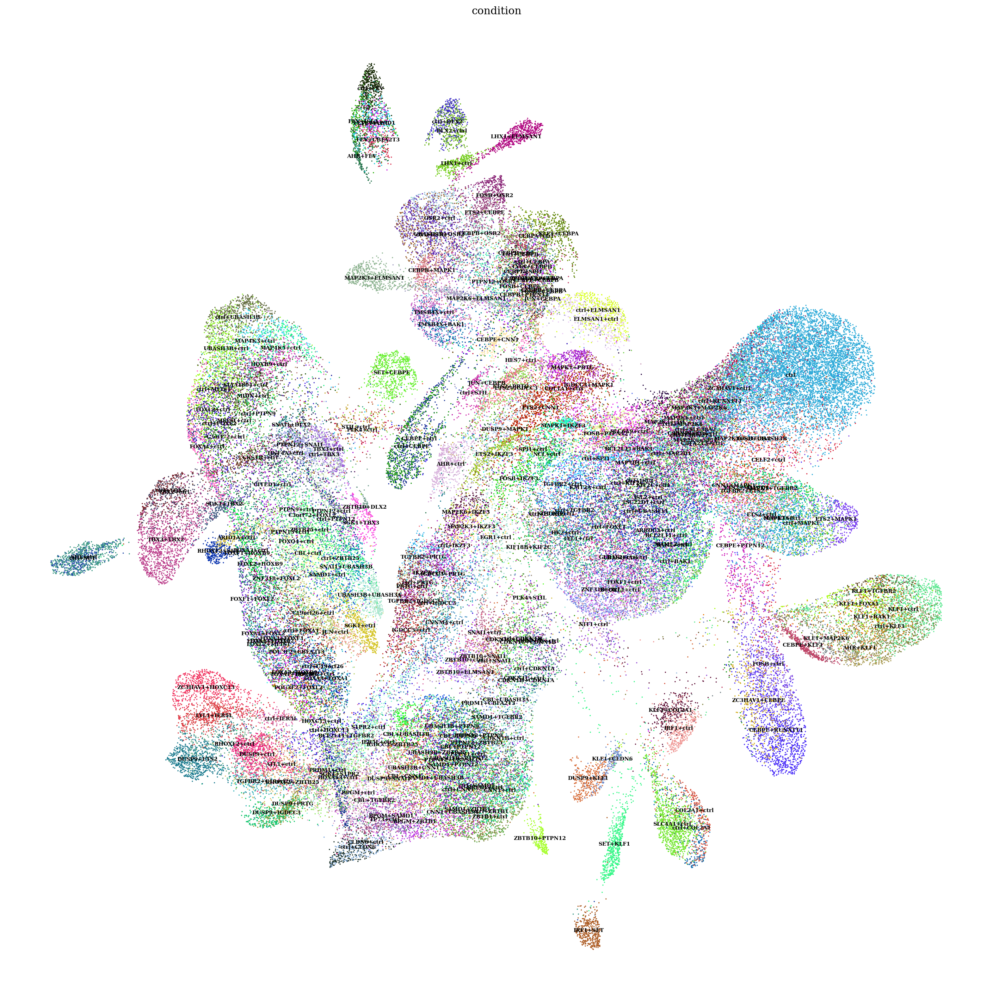

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

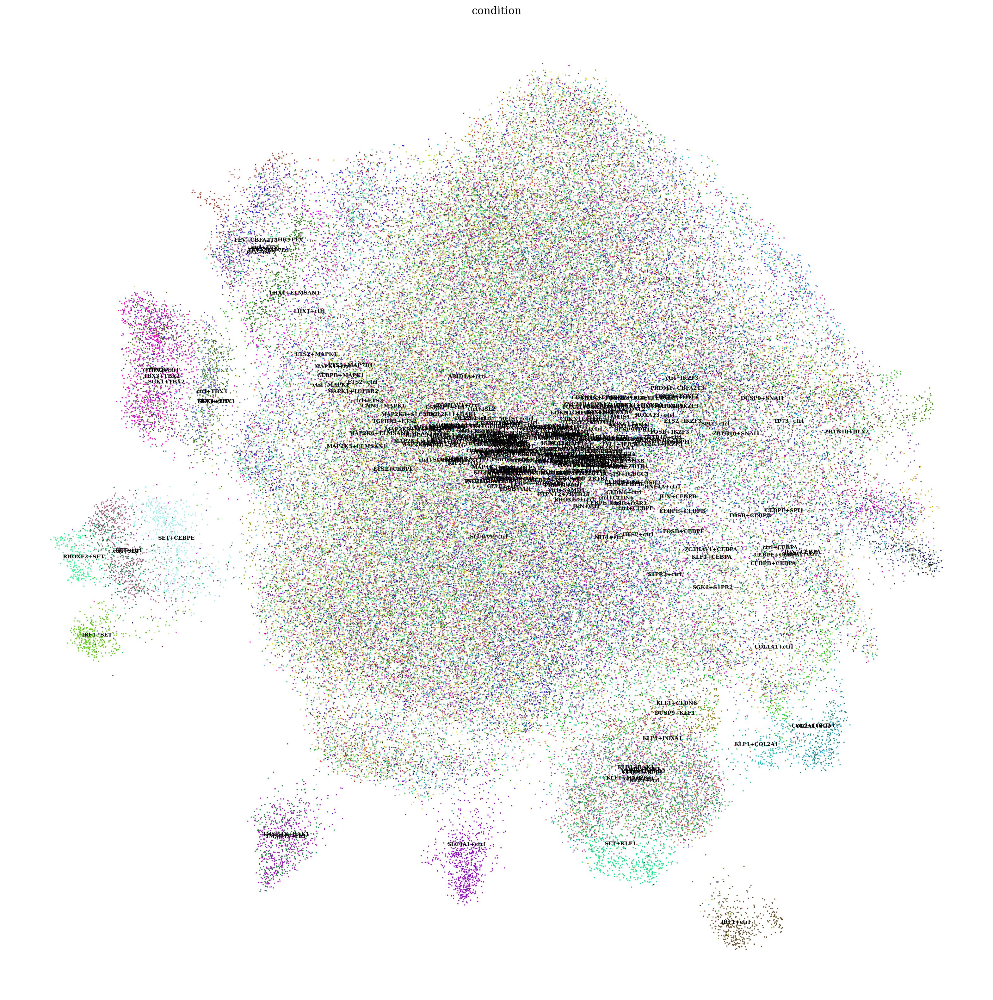

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()